# Plant Seedlings Classification
#### Determine a seedling Species from an image

# Tags

`#Plant` `#Seedlings` `#Leaf` `#OpenCV2` `#Matplotlib` `#Seaborn` `#LabelEncoder` `#PCA` `#t-SNE` `#EigenVector` `#CNN` `#TransferLearning` `#Xception` `#VGG` `#Keras` `#Sklearn` `#ClassifierComparison` `#XGB`

* `Author : Indiano`
* `September 2018`

---

## Content


 1. Introduction (5 min)
     * Objective
     * Description
     * Evaluation
     * Imports Libraries
 2. Data Understanding (15 min)
     * Helper Functions 
     * Load data
     * Basic Statistical summaries and visualisations
 3. Data Preparation (25 min)
     * Sanitize Data
     * Categorize Class Labels
     * Advanced Statistical Summaries & Visualisations
     * PCA Visualization
     * t-SNE Visualization (2D & 3D)
     * Normalization
 4. Modeling, Evaluation & Submission (25 min)
     * CNN
     * Transfer Learning using Xception, VGG, ImageNet
     * XGB using only countour features
 5. Deployment  (5 min)
     * Submit result to Kaggle leaderboard     
 6. Further Improvements
     * Some ideas for increasing the accuracy
     
[Adopted from Cross Industry Standard Process for Data Mining (CRISP-DM)](http://www.sv-europe.com/crisp-dm-methodology/)

![CripsDM](https://i.pinimg.com/originals/d3/fe/6d/d3fe6d904580fa4e642225ae6d18f0da.jpg "Process diagram showing the relationship between the different phases of CRISP-DM")

# 1. Introduction

[Based on Kaggle Plant Seedlings Classification](https://www.kaggle.com/c/plant-seedlings-classification)

## 1.1 Objective

Classify `an image` of `seedling` into one the following `12 different` seedling `classes`.

1. **Black-grass**
2. **Charlock**
3. **Cleavers**
4. **Common Chickweed**
5. **Common wheat**
6. **Fat Hen**
7. **Loose Silky-bent**
8. **Maize**
9. **Scentless Mayweed**
10. **Shepherds Purse**
11. **Small-flowered Cranesbill**
12. **Sugar beet**

## 1.2 Description

Can you differentiate a `weed` from a crop `seedling`?

The ability to do so effectively can mean `better crop yields` and `better stewardship of the environment`.

The Aarhus University Signal Processing group, in collaboration with University of Southern Denmark, has recently released a dataset containing images of approximately 960 unique plants belonging to 12 species at several growth stages.

We're hosting this dataset as a Kaggle competition in order to give it wider exposure, to give the community an opportunity to experiment with different image recognition techniques, as well to provide a place to cross-pollenate ideas.

### Citation
[A Public Image Database for Benchmark of Plant Seedling Classification Algorithms](https://arxiv.org/abs/1711.05458v1)

## 1.3 Evaluation

Submissions are evaluated on MeanFScore, which at Kaggle is actually a micro-averaged F1-score.

Given positive/negative rates for each class k, the resulting score is computed this way:


$Precisionmicro=∑k∈CTPk∑k∈CTPk+FPk$

$Recallmicro=∑k∈CTPk∑k∈CTPk+FNk$


F1-score is the harmonic mean of precision and recall


$MeanFScore=F1micro= $\Frac{2PrecisionmicroRecallmicro}{Precisionmicro+Recallmicro}$


## 1.4 Imports 

In [119]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Theano MKL Problem
import os
os.environ["MKL_THREADING_LAYER"] = "GNU"

# Formatting
import pprint as pretty
from tabulate import tabulate

# Memory usage
import ipython_memory_usage.ipython_memory_usage as imu

# System related libraries
import os
import importlib
from joblib import Parallel, delayed
from sklearn.externals import joblib
from time import time

# Handle table-like data and matrices
import pickle
import numpy as np
import pandas as pd

# Collections
from itertools import product, compress
from functools import reduce
from operator import itemgetter
from collections import defaultdict
from glob import glob

# Image
import imageio
import cv2

# Sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import decomposition
from sklearn.neighbors import KernelDensity
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from skimage.transform import resize as imresize

# Modelling Algorithms
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression, Ridge, Lasso, RandomizedLasso
from sklearn.svm import SVC, LinearSVC
from xgboost import XGBClassifier

# Modelling Helpers
from sklearn.model_selection import train_test_split, StratifiedKFold

# Keras
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Activation, Dropout, Maximum, ZeroPadding2D
from keras.layers.convolutional import Conv2D
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras import regularizers
from keras.layers import BatchNormalization
from keras.optimizers import Adam, SGD
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
from keras.layers.advanced_activations import LeakyReLU
from keras.utils import to_categorical
from keras.applications import xception, vgg16

# Auto-ML
import autosklearn.classification
from tpot import TPOTClassifier

# Visualization
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1 import ImageGrid
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
import seaborn as sns

from IPython.display import display, HTML
from tqdm import tqdm

# Configure visualisations
plt.style.use('ggplot')
sns.set_style('white')
# pylab.rcParams[ 'figure.figsize' ] = 8 , 6
%matplotlib inline

# Monitoring memory usage in jupyter notebooks; mprof run test.py & mprof plot
# %memit
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [2]:
from subprocess import check_output
print(check_output(["ls", "./"]).decode("utf8"))

checkpoint
checkpoint (copy)
data
logs
logs1536318716.4047165
save
seedlings
Seedlings.ipynb
visualization



In [3]:
%ls data/all/train

 Black-grass/        'Common wheat'/      'Scentless Mayweed'/
 Charlock/           'Fat Hen'/           'Shepherds Purse'/
 Cleavers/           'Loose Silky-bent'/  'Small-flowered Cranesbill'/
'Common Chickweed'/   Maize/              'Sugar beet'/


In [4]:
%memit

peak memory: 312.84 MiB, increment: 0.03 MiB


In [5]:
# Same as label_to_id_dict

CLASS = {
    'Black-grass': 0,
    'Charlock': 1,
    'Cleavers': 2,
    'Common Chickweed': 3,
    'Common wheat': 4,
    'Fat Hen': 5,
    'Loose Silky-bent': 6,
    'Maize': 7,
    'Scentless Mayweed': 8,
    'Shepherds Purse': 9,
    'Small-flowered Cranesbill': 10,
    'Sugar beet': 11
}

# Same as id_to_label_dict

INV_CLASS = {
    0: 'Black-grass',
    1: 'Charlock',
    2: 'Cleavers',
    3: 'Common Chickweed',
    4: 'Common wheat',
    5: 'Fat Hen',
    6: 'Loose Silky-bent',
    7: 'Maize',
    8: 'Scentless Mayweed',
    9: 'Shepherds Purse',
    10: 'Small-flowered Cranesbill',
    11: 'Sugar beet'
}

# 2. Data Understanding

In [6]:
# Data directory

root_dir = './data/all'
train_dir = os.path.join(root_dir, 'train')
test_dir = os.path.join(root_dir, 'test')

## 2.1 Helper Functions

### 2.1.1 Mask, Segment & Sharpen Functions

The `create_mask_for_plant` function returns an image `mask matrix` of image_height * image_width shape. The mask matrix contains only boolean values of 0 & 1 indicating seedlings background and foreground region.

At the end, we will do `morphological close operation` to keep the original shape of the foreground (1 blob on the mask image) but `close the spurious small holes`. 

![alt text](https://www.cs.auckland.ac.nz/courses/compsci773s1c/lectures/ImageProcessing-html/mor-pri-erosion.gif "Morphological Operations")

In [12]:
# Segment Mask & Sharpen for the plant


def create_mask_for_plant(image):

    # Convert to HSV image
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create mask
    sensitivity = 35
    lower_hsv = np.array([60 - sensitivity, 100, 50])
    upper_hsv = np.array([60 + sensitivity, 255, 255])

    mask = cv2.inRange(image_hsv, lower_hsv, upper_hsv)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return mask


def segment_plant(image):
    mask = create_mask_for_plant(image)
    output = cv2.bitwise_and(image, image, mask=mask)
    return output


def sharpen_image(image):
    image_blurred = cv2.GaussianBlur(image, (0, 0), 3)
    image_sharp = cv2.addWeighted(image, 1.5, image_blurred, -0.5, 0)
    return image_sharp


# Mask, Segment & Sharpen an Image


def mark_segment_sharpen_image(img, img_size=(45, 45)):
    # Resize image
    img = cv2.resize(img.copy(), img_size, interpolation=cv2.INTER_AREA)

    image_mask = create_mask_for_plant(img)
    image_segmented = segment_plant(img)
    image_sharpened = sharpen_image(image_segmented)

    return img, image_mask, image_segmented, image_sharpened

### 2.1.2 Contour Calculation Functions

In [101]:
# Find contours and calculate the largest contour & total area


def find_contours(mask_image):
    return cv2.findContours(mask_image, cv2.RETR_EXTERNAL,
                            cv2.CHAIN_APPROX_SIMPLE)[-2]


def calculate_largest_contour_area(contours):
    if len(contours) == 0:
        return 0
    c = max(contours, key=cv2.contourArea)
    return cv2.contourArea(c)


def calculate_contours_area(contours, min_contour_area=250):
    area = 0
    for c in contours:
        c_area = cv2.contourArea(c)
        if c_area >= min_contour_area:
            area += c_area
    return area

### 2.1.3 Visualize Images Functions

In [7]:
# Plot the plant images on a grid according to each class label


def image_grid_plot_for_classes(labels=['Black-grass'], nb_cols=12):

    fig = plt.figure(1, figsize=(nb_cols, nb_cols))
    grid = ImageGrid(
        fig, 111, nrows_ncols=(len(labels), nb_cols), axes_pad=0.05)

    # Iterating over different class labels
    for i, label in enumerate(labels):
        for j in range(0, nb_cols):
            axs = grid[i * nb_cols + j]
            axs.imshow(cv2.resize(images_per_class[label][j], (150, 150)))
            axs.axis('off')

        # Class label text
        axs.text(170, 75, label, verticalalignment='center')

    plt.show()


# Plot the plant images on a grid according to each class label


def grid_plot_for_class(labels=['Black-grass'], nb_cols=12):

    nb_rows, nb_cols = len(labels), nb_cols

    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(12, 12))

    # Iterating over different class labels
    for i, label in enumerate(labels):
        for j in range(0, nb_cols):
            axs[i, j].imshow(
                cv2.resize(images_per_class[label][j], (150, 150)),
                aspect='auto')
            axs[i, j].axis('off')

        axs[i, j].text(170, 75, label, verticalalignment='center')

    plt.show()


# Plot the plant images according to each class label


def plot_for_class(label, nb_rows=3, nb_cols=3):

    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(12, 12))

    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].xaxis.set_ticklabels([])
            axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].imshow(images_per_class[label][n])
            n += 1


# visualize_scatter_with_images


def visualize_scatter_with_images(X_2d_data,
                                  images,
                                  figsize=(45, 45),
                                  image_zoom=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    plt.show()


# visualize_scatter


def visualize_scatter(data_2d, label_ids, figsize=(20, 20)):
    plt.figure(figsize=figsize)
    plt.grid()

    nb_classes = len(np.unique(label_ids))

    for label_id in np.unique(label_ids):
        plt.scatter(
            data_2d[np.where(label_ids == label_id), 0],
            data_2d[np.where(label_ids == label_id), 1],
            marker='o',
            color=plt.cm.Set1(label_id / float(nb_classes)),
            linewidth='1',
            alpha=0.8,
            label=id_to_label_dict[label_id])
    plt.legend(loc='best')


# visualize_scatter with 3D animation


def visualize_scatter_3D(data_3d, label_ids):

    fig = plt.figure(figsize=(25, 25))
    ax = fig.add_subplot(111, projection='3d')
    plt.grid()

    nb_classes = len(np.unique(label_ids))

    for label_id in np.unique(label_ids):
        ax.scatter(
            data_3d[np.where(label_ids == label_id), 0],
            data_3d[np.where(label_ids == label_id), 1],
            data_3d[np.where(label_ids == label_id), 2],
            alpha=0.8,
            color=plt.cm.Set1(label_id / float(nb_classes)),
            marker='o',
            label=id_to_label_dict[label_id])

    ax.legend(loc='best')
    ax.view_init(25, 45)
    ax.set_xlim(-2.5, 2.5)
    ax.set_ylim(-2.5, 2.5)
    ax.set_zlim(-2.5, 2.5)

    # Create GIF
    anima = animation.FuncAnimation(
        fig,
        lambda frame_number: ax.view_init(30, 4 * frame_number),
        interval=175,
        frames=90)
    anima.save(
        os.path.join('./visualization', 'seedlings_3D.gif'),
        writer='imagemagick')

### 2.1.4 Plot the missclassified plant images on a grid & Confusion Matrix

In [85]:
# Plot the missclassified plant images on a grid


def grid_plot_for_class(missclassified, nb_cols=3):

    nb_rows = int(missclassified.shape[0] / nb_cols) + 1

    fig = plt.figure(figsize=(15, 15))

    # Iterating over different missclassified images
    for index, (_, image) in enumerate(missclassified.iterrows()):

        # Add a subplot. Either a 3-digit integer or three separate integers describing the position of the subplot.
        # If the three integers are R, C, and P in order, the subplot will take the Pth position on
        # a grid with R rows and C columns.
        axs = fig.add_subplot(nb_rows, nb_cols, index + 1)

        axs.text(
            0, -15, INV_CLASS[image['Prediction']], horizontalalignment='left')
        axs.imshow(cv2.resize(image['Image'], (150, 150)), aspect='auto')
        axs.text(
            75,
            -15,
            'True: {}'.format(INV_CLASS[image['True']]),
            horizontalalignment='left')
        axs.axis('off')

    plt.show()


# Plot the confusion matrix


def plot_confusion_matrix(cm,
                          target_names,
                          plt_name,
                          rootdir='./',
                          save_dir='save/',
                          title='Confusion matrix',
                          cmap=None,
                          normalize=False):
    """
        plot_confusion_matrix function prints & plots the confusion matrix.
        Normalization can be applied by setting `normalize=True`.
        :param cm:confusion matrix from sklearn.metrics.confusion_matrix
        :param target_names:classification classes list eg. [0, 1] ['high', 'medium', 'low']
        :param rootdir:str
        :param save_dir:str
        :param plt_name:str
        :param title:str
        :param cmap:color map list
        :param normalize:bool
        :return:
        """

    plt_name += '_ConfusionMatrix'
    if normalize:
        plt_name = '{}_Normalized'.format(plt_name)

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(12, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(
                j,
                i,
                "{:0.4f}".format(cm[i, j]),
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(
                j,
                i,
                "{:,}".format(cm[i, j]),
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\n\nAccuracy={:0.4f}; Misclassified={:0.4f}'.
               format(accuracy, misclass))

    print('\n\nSaving Confusion Matrices in the {} directory'.format(rootdir +
                                                                     save_dir))
    plt.savefig(
        rootdir + save_dir + '/{}.png'.format(plt_name),
        dpi=200,
        format='png',
        bbox_inches='tight')

    plt.show()
    plt.close()

## 2.2 Load Data

Let's read the seedlings images in `BGR` (Blue/Green/Red) OpenCV's default format. It won't affect the segmentation in-case if you'd like to use `RGB` format. Anyhow, `HSV` (Hue/Saturation/Value) color space will be used for the processing of images.

### First Approach: Using Simple dictionary

In [7]:
# Flatten the plant images data after Segmentation & Masking


def load_seedlings(train_dir=os.path.join(root_dir, 'train'),
                   init_img_size=(150, 150),
                   final_img_size=(45, 45)):
    images = []
    labels = []
    images_per_class = defaultdict(list)

    for class_folder_name in os.listdir(train_dir):
        class_folder_path = os.path.join(train_dir, class_folder_name)

        for image_path in glob(os.path.join(class_folder_path, "*.png")):
            # Read an image
            image = cv2.imread(image_path, cv2.IMREAD_COLOR)

            # Stats for each seedlings class
            images_per_class[class_folder_name].append(image)

            # Resize image to default init_img_size pixels 150*150
            image = cv2.resize(
                image, init_img_size, interpolation=cv2.INTER_AREA)

            # Segementation
            image = segment_plant(image)

            # BGR2GRAY conversion
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Resize image to default final_img_size pixels 45*45
            if (init_img_size != final_img_size):
                image = cv2.resize(
                    image, img_size, interpolation=cv2.INTER_AREA)

            image = image.flatten()

            images.append(image)
            labels.append(class_folder_name)

    images = np.array(images)
    labels = np.array(labels)

    return images, labels, images_per_class

In [11]:
# Load Images, Labels & images_per_class dict

try:
    print('Loading Images, Labels & images_per_class dict ...')
    images = joblib.load(os.path.join('./save/pickles', 'images.pickle'))
    labels = joblib.load(os.path.join('./save/pickles', 'labels.pickle'))
    images_per_class = joblib.load(
        os.path.join('./save/pickles', 'images_per_class.pickle'))
    print('Loading done.')
except Exception as e:
    print('Stacktrace', e)
    print('Images, Labels or images_per_class dict does not exist.')

if not (images.size or labels.size) or (not images_per_class):
    print('Running load_seedlings method ...')
    images, labels, images_per_class = load_seedlings()

    print('Dumping Images, Labels & images_per_class dict ...')
    # Dumping dicts
    joblib.dump(images, os.path.join('./save/pickles', 'images.pickle'))
    joblib.dump(labels, os.path.join('./save/pickles', 'labels.pickle'))
    joblib.dump(images_per_class,
                os.path.join('./save/pickles', 'images_per_class.pickle'))
    print('Images, Labels or images_per_class dict dumping done.')

Loading Images, Labels & images_per_class dict ...
Loading done.


#### Number of images per class

In [42]:
for key, value in images_per_class.items():
    print("{0} -> {1}".format(key, len(value)))

Charlock -> 390
Common Chickweed -> 611
Shepherds Purse -> 231
Small-flowered Cranesbill -> 496
Common wheat -> 221
Fat Hen -> 475
Cleavers -> 287
Sugar beet -> 385
Maize -> 221
Loose Silky-bent -> 654
Scentless Mayweed -> 516
Black-grass -> 263


### Second Approach: Using Train & Test dictionary 

In [5]:
# Resize all image to 51x51
def img_reshape(img):
    img = imresize(img, (51, 51, 3))
    return img


# get image tag
def img_label(path):
    return str(str(path.split('/')[-1]))


# get plant class on image
def img_class(path):
    return str(path.split('/')[-2])


# fill train and test dict
def fill_dict(paths, some_dict):
    text = ''
    if 'train' in paths[0]:
        text = 'Start fill train_dict'
    elif 'test' in paths[0]:
        text = 'Start fill test_dict'

    for p in tqdm(paths, ascii=True, ncols=85, desc=text):
        img = imageio.imread(p)
        img = img_reshape(img)
        some_dict['image'].append(img)
        some_dict['label'].append(img_label(p))
        if 'train' in paths[0]:
            some_dict['class'].append(img_class(p))

    return some_dict


# read image from dir. and fill train and test dict
def reader():
    file_ext = []
    train_path = []
    test_path = []

    for root, dirs, files in os.walk('./data/all'):
        if dirs != []:
            print('Root:\n' + str(root))
            print('Dirs:\n' + str(dirs))
        else:
            for f in files:
                ext = os.path.splitext(str(f))[1][1:]

                if ext not in file_ext:
                    file_ext.append(ext)

                if 'train' in root:
                    path = os.path.join(root, f)
                    train_path.append(path)
                elif 'test' in root:
                    path = os.path.join(root, f)
                    test_path.append(path)
    train_dict = {'image': [], 'label': [], 'class': []}
    test_dict = {'image': [], 'label': []}

    train_dict = fill_dict(train_path, train_dict)
    test_dict = fill_dict(test_path, test_dict)

    return train_dict, test_dict

## 2.3 Basic Statistical Summaries & Visualisations¶

To understand the data we are now going to consider some key facts about seedlings `class` and `count`. 

In [39]:
# Dataframe containing seedlings class and count

images_per_class_df = pd.DataFrame({
    'Class': list(images_per_class.keys()),
    'Count': [len(value) for value in images_per_class.values()]
})
images_per_class_df.head()

,Class,Count
0,Charlock,390
1,Common Chickweed,611
2,Shepherds Purse,231
3,Small-flowered Cranesbill,496
4,Common wheat,221


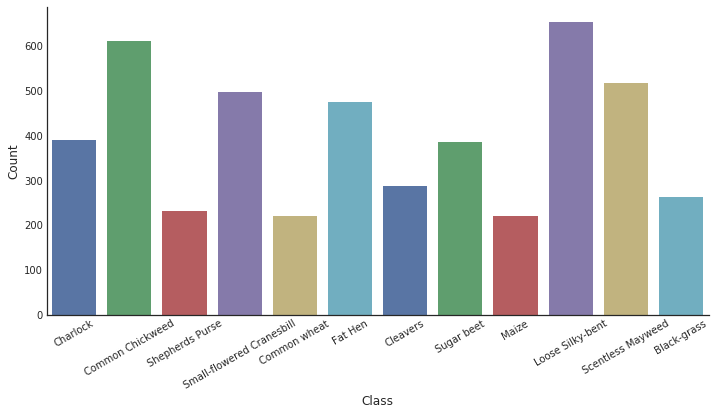

In [38]:
# Plot seedlings by class and count

seaborn = sns.FacetGrid(images_per_class_df, size=5, aspect=2)
seaborn.map(sns.barplot, 'Class', 'Count', palette='deep')
seaborn.set_xticklabels(rotation=30)
seaborn.add_legend()

Plot an `image grid` of `Small-flowered Cranesbill` plant seedlings

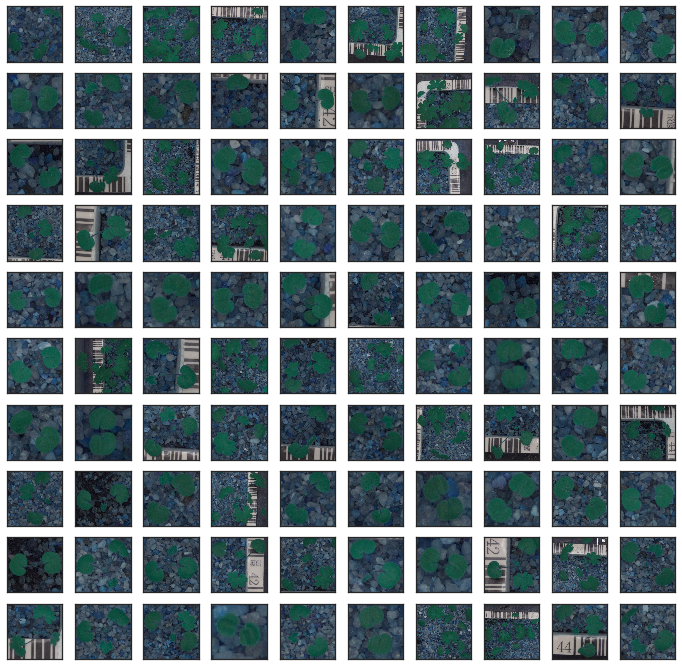

In [34]:
plot_for_class("Small-flowered Cranesbill", nb_rows=10, nb_cols=10)

Plot an `image grid` of `Maize` plant seedlings

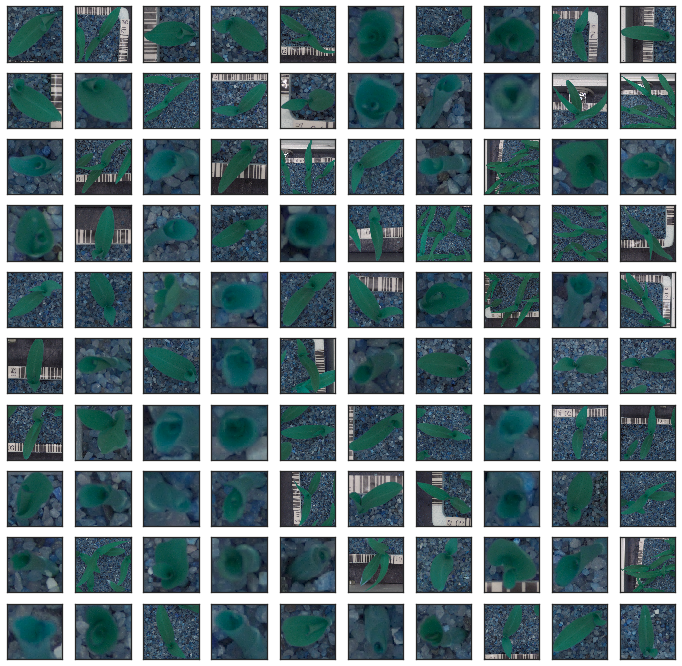

In [49]:
plot_for_class("Maize", nb_rows=10, nb_cols=10)

Plot an `image grid` of `All` seedling

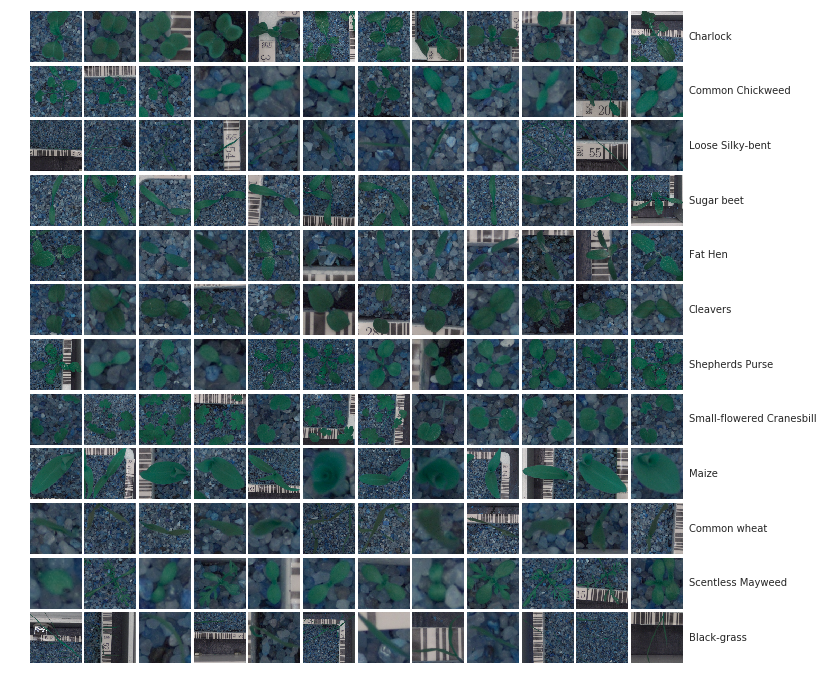

In [137]:
image_grid_plot_for_classes(list(images_per_class.keys()), nb_cols=12)

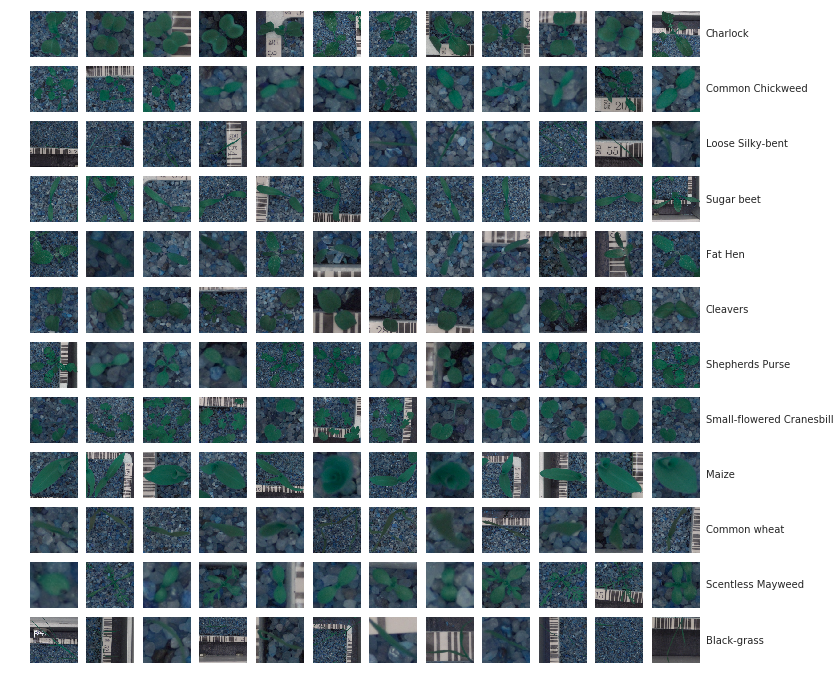

In [182]:
grid_plot_for_class(list(images_per_class.keys()), nb_cols=12)

# 3. Data Preparation

After statistics analysis & visualizing the different aspects of images, we will `sanitize` or clean the training data for our model.

## 3.1 Sanitize Data

As we can see that each image has a background which makes contour of plant leaves obscure or unclear. Hence we will segregate background from foreground and hope it might help us achieve better accuracy.

For removing the background, we'll use the fact that all plant leaves are green and we can create a mask to remove background.

### Masking, Segmenting & Sharpening Green 

For creating mask, which will remove background, we need to convert BGR/RGB image to HSV. HSV is alternative of the BGR/RGB color model. In HSV, it is easier to represent a color range than in BGR/RGB color space.

Being a simple object detection problem, we will use the color of the object for background segregation. The HSV color-space is suitable for color detection because we can define a color with `Hue` and it's variations or spectrum using `Saturation` & `Value`. eg. Red, Darker Red, Lighter Red.

The following figure illustrates the HSV color space.

![alt text](https://www.mathworks.com/help/images/hsvcone.gif "HSV to RGB Color Space")

As hue varies from 0 to 1.0, the corresponding colors vary from red through yellow, green, cyan, blue, magenta, and back to red, so that there are actually red values both at 0 and 1.0. As saturation varies from 0 to 1.0, the corresponding colors (hues) vary from unsaturated (shades of gray) to fully saturated (no white component). As value, or brightness, varies from 0 to 1.0, the corresponding colors become increasingly brighter.

[HSV to RGB Color Space](https://www.mathworks.com/help/images/convert-from-hsv-to-rgb-color-space.html)

In [60]:
# Plot the plant images according to each class label


def plot_masked_image(images, nb_cols=4):

    # Generate figure, axes
    fig, axes = plt.subplots(
        nrows=len(images), ncols=nb_cols, figsize=(12, 12))

    # Iterating over different trials & parameters
    for index, image in enumerate(images):

        # Mask, Segment & Sharpen
        image_mask = create_mask_for_plant(image)
        image_segmented = segment_plant(image)
        image_sharpen = sharpen_image(image_segmented)

        # Show images
        axes[index, 0].imshow(image)
        axes[index, 1].imshow(image_mask)
        axes[index, 2].imshow(image_segmented)
        axes[index, 3].imshow(image_sharpen)

        # Set x, y tick labels
        axes[index, 0].xaxis.set_ticklabels([])
        axes[index, 0].yaxis.set_ticklabels([])
        axes[index, 1].xaxis.set_ticklabels([])
        axes[index, 1].yaxis.set_ticklabels([])
        axes[index, 2].xaxis.set_ticklabels([])
        axes[index, 2].yaxis.set_ticklabels([])
        axes[index, 3].xaxis.set_ticklabels([])
        axes[index, 3].yaxis.set_ticklabels([])

    plt.show()

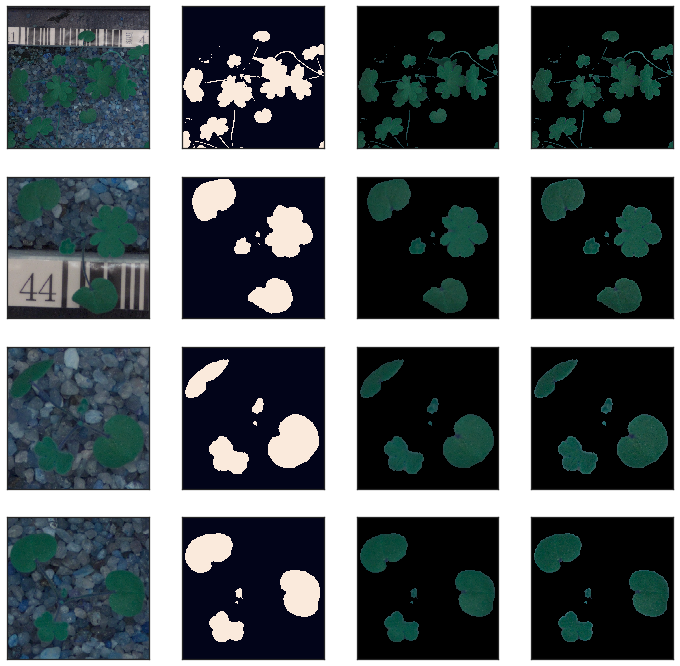

In [61]:
plot_masked_image(images_per_class["Small-flowered Cranesbill"][97:101])

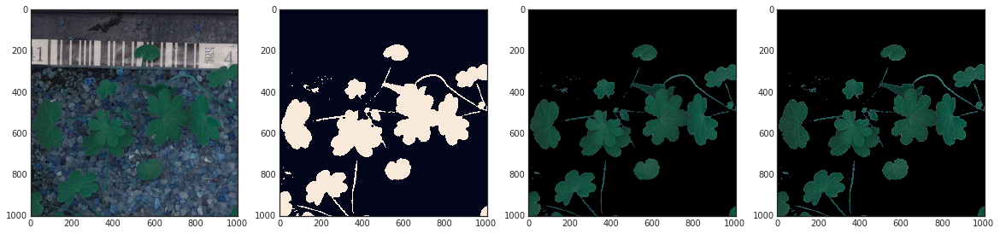

In [19]:
# Test image to see the changes

image = images_per_class["Small-flowered Cranesbill"][97]

image_mask = create_mask_for_plant(image)
image_segmented = segment_plant(image)
image_sharpened = sharpen_image(image_segmented)

# Segment Mask & Sharpen for the plant using mark_segment_sharpen_image method
# image, image_mask, image_segmented, image_sharpened = mark_segment_sharpen_image(image, img_size=(150, 150))

fig, axs = plt.subplots(1, 4, figsize=(20, 20))
axs[0].imshow(image)
axs[1].imshow(image_mask)
axs[2].imshow(image_segmented)
axs[3].imshow(image_sharpened)

## 3.2 Categorize Class Labels

Let's create a dictionary and reverse dictionary containing mapping from label to id & vice-versa.

### First Approach: Using Simple dictionary with for loop

In [124]:
# Create a mapping from a flower class to an unique integer id & vice-versa

label_to_id_dict = {v: i for i, v in enumerate(np.unique(labels))}
id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}

# Covert train images label into id
label_ids = np.array([label_to_id_dict[x] for x in labels])

### Second Approach: Using LabelEncoder

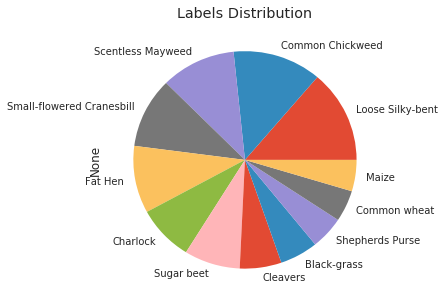



Classes:  ['Black-grass' 'Charlock' 'Cleavers' 'Common Chickweed' 'Common wheat'
 'Fat Hen' 'Loose Silky-bent' 'Maize' 'Scentless Mayweed'
 'Shepherds Purse' 'Small-flowered Cranesbill' 'Sugar beet']

Number of One Hot encoded class labels:  12


In [104]:
# Plot of label types numbers
pd.Series(labels).value_counts().plot(
    kind='pie', title='Labels Distribution', figsize=(5, 5))
plt.show()

# Encode labels and create classes
le = LabelEncoder()
le.fit(labels)
labels_encoded = le.transform(labels)
print("\n\nClasses: ", le.classes_)

# Convert labels into categorical values
labels_onehot = to_categorical(labels_encoded)
print("\nNumber of One Hot encoded class labels: ", labels_onehot.shape[1])

## 3.3 Advanced Statistical Summaries & Visualisations¶

### 3.3.1 Contours Statistics

From the mask image, we can extract some features like the contour area and number of components etc. and understand how the area of a plant changes according to each class. 

We can extract much more interesting information from `contours`. Please have a look below for further information.

Additional read: https://en.wikipedia.org/wiki/Image_moment

In [99]:
# Load images_per_class dictionary

images_per_class = joblib.load(
    os.path.join('./save/pickles', 'images_per_class.pickle'))

In [102]:
# Let's find contours and calculate the largest contour & total area

areas = []
larges_contour_areas = []
labels = []
nb_of_contours = []
images_height = []
images_width = []

for class_label in images_per_class.keys():
    for image in images_per_class[class_label]:

        # Mask for an image
        mask = create_mask_for_plant(image)

        # Find & calculate contour stats
        contours = find_contours(mask)
        area = calculate_contours_area(contours)
        largest_area = calculate_largest_contour_area(contours)
        height, width, channels = image.shape

        # Save the stats in the lists
        nb_of_contours.append(len(contours))
        areas.append(area)
        larges_contour_areas.append(largest_area)
        images_height.append(height)
        images_width.append(width)

        labels.append(class_label)

In [105]:
# Save the features in a dataframe

features_df = pd.DataFrame(data={
    'label': labels,
    'area': areas,
    'largest_contour_area': larges_contour_areas,
    'no_of_countours': nb_of_contours,
    'height': images_height,
    'width': images_width
})
features_df.to_hdf(
    os.path.join('./save/pickles', 'contours_features_df.hdf'),
    key='contours_features_df',
    mode='w')
features_df.groupby("label").describe()

area                                        \
                           count           mean            std     min   
label                                                                    
Black-grass                263.0   41793.982890  159636.952451     0.0   
Charlock                   390.0   91669.094872  150626.968468  3177.5   
Cleavers                   287.0   25619.073171   24726.375631   567.5   
Common Chickweed           611.0   14935.878887   20172.494215     0.0   
Common wheat               221.0    6949.357466    8161.181143     0.0   
Fat Hen                    475.0   30623.629474   67760.225738   512.0   
Loose Silky-bent           654.0   24618.366208  132431.879535     0.0   
Maize                      221.0  115311.341629  206882.627747   851.5   
Scentless Mayweed          516.0   15517.381783   27678.754205     0.0   
Shepherds Purse            231.0   38187.586580   66440.811037   562.0   
Small-flowered Cranesbill  496.0   38126.337702   48735.741208   678.5   
Sugar beet                 385.0   79003.370130  112091.057669     0.0   

                                                                      height  \
                                 25%       50%         75%        max  count   
label                                                                          
Black-grass                 1559.750   7204.00   23556.250  2097133.5  263.0   
Charlock                   12795.125  39382.25   80786.125  1193936.5  390.0   
Cleavers                    8368.000  18717.50   34363.000   175187.0  287.0   
Common Chickweed            1917.500   5026.00   25140.000   131654.5  611.0   
Common wheat                1883.000   4044.50    8953.000    57880.0  221.0   
Fat Hen                     2804.250   6153.50   28209.000   561161.5  475.0   
Loose Silky-bent             718.500   1795.50    8252.500  1930040.5  654.0   
Maize                       3885.500  52033.00  119356.000  1435536.5  221.0   
Scentless Mayweed           1589.250   3314.25   14044.125   198328.5  516.0   
Shepherds Purse             3303.500   7435.50   45623.250   415662.5  231.0   
Small-flowered Cranesbill   7834.625  16201.50   42556.500   306815.5  496.0   
Sugar beet                 16029.000  40748.50   81174.000   815699.0  385.0   

                                        ...   no_of_countours         width  \
                                 mean   ...               75%    max  count   
label                                   ...                                   
Black-grass                661.307985   ...             22.00  195.0  263.0   
Charlock                   431.976923   ...              2.75   61.0  390.0   
Cleavers                   310.292683   ...              4.00   32.0  287.0   
Common Chickweed           230.708674   ...              2.00   24.0  611.0   
Common wheat               440.167421   ...             37.00  203.0  221.0   
Fat Hen                    303.008421   ...              5.00   88.0  475.0   
Loose Silky-bent           397.897554   ...             12.00  305.0  654.0   
Maize                      483.239819   ...              4.00   87.0  221.0   
Scentless Mayweed          226.003876   ...              2.00  123.0  516.0   
Shepherds Purse            288.541126   ...              2.00   49.0  231.0   
Small-flowered Cranesbill  342.316532   ...             10.00   92.0  496.0   
Sugar beet                 590.309091   ...              4.00   19.0  385.0   

                                                                         \
                                 mean         std    min     25%    50%   
label                                                                     
Black-grass                668.638783  520.794148   73.0  290.00  586.0   
Charlock                   431.982051  287.746036  121.0  188.00  375.5   
Cleavers                   310.292683  151.918747   66.0  171.50  298.0   
Common Chickweed           230.708674  160.842547   54.0  107.50  156.0   
Commo

In [106]:
features_df.head()

,area,height,label,largest_contour_area,no_of_countours,width
0,24198.5,360,Cleavers,12418.0,3,360
1,8176.0,149,Cleavers,8176.0,1,149
2,12717.0,225,Cleavers,12717.0,1,225
3,35139.0,404,Cleavers,21444.0,5,404
4,20688.0,315,Cleavers,9436.0,12,315


In [107]:
del images_per_class

### 3.3.2 PCA Visualization

Let's load the seedlings images & corresponding helper function.

#### Map Labels function 

In [92]:
# Create a mapping from a flower class to an unique integer id & vice-versa

label_grey_to_id_dict = {v: i for i, v in enumerate(np.unique(labels_grey))}

# Covert train images label into id

labels_grey_ids = np.array([label_grey_to_id_dict[x] for x in labels_grey])

#### Load Seedlings function 

In [58]:
# Return Grey the plant images data


def load_seedlings_grey(train_dir=os.path.join(root_dir, 'train'),
                        img_size=(150, 150)):
    images = []
    labels = []
    images_mask = []

    for class_folder_name in os.listdir(train_dir):
        class_folder_path = os.path.join(train_dir, class_folder_name)

        for image_path in glob(os.path.join(class_folder_path, "*.png")):
            # Read an image
            image = cv2.imread(image_path, cv2.IMREAD_COLOR)

            # Resize image to default init_img_size pixels 150*150
            image = cv2.resize(image, img_size, interpolation=cv2.INTER_AREA)

            _, image_mask, _, image = mark_segment_sharpen_image(
                image, img_size=(150, 150))

            # BGR2GRAY conversion
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            images.append(image)
            images_mask.append(image_mask)
            labels.append(class_folder_name)

    images = np.array(images)
    images_mask = np.array(images_mask)
    labels = np.array(labels)

    return images, images_mask, labels

In [59]:
images_grey = np.array([])
images_grey_mask = np.array([])
labels_grey = np.array([])

# Load Grey images & labels

try:
    print('Loading Grey Images, Images Mask & Labels dict ...')
    images_grey = joblib.load(
        os.path.join('./save/pickles', 'images-grey.pickle'))
    images_grey_mask = joblib.load(
        os.path.join('./save/pickles', 'images-grey-mask.pickle'))
    labels_grey = joblib.load(
        os.path.join('./save/pickles', 'labels-grey.pickle'))
    print('Loading done.')
except Exception as e:
    print('Stacktrace', e)
    print('Grey Images, Images Mask or Labels dict does not exist.')

if (not images_grey.size or not images_grey_mask.size or not labels_grey.size):
    img_size = (150, 150)
    print('Running Grey load_seedlings method with img_size {} ...'.format(
        img_size))
    images_grey, images_grey_mask, labels_grey = load_seedlings_grey(
        img_size=img_size)

    print('Dumping Grey Images, Images Mask & Labels dict ...')
    # Dumping dicts
    joblib.dump(images_grey,
                os.path.join('./save/pickles', 'images-grey.pickle'))
    joblib.dump(images_grey_mask,
                os.path.join('./save/pickles', 'images-grey-mask.pickle'))
    joblib.dump(labels_grey,
                os.path.join('./save/pickles', 'labels-grey.pickle'))
    print('Grey Images, Images Mask & Labels dict dumping done.')

print('Shape of images_grey: ', images_grey.shape)
print('Shape of images_grey_mask: ', images_grey_mask.shape)
print('Shape of labels_grey: ', labels_grey.shape)

Loading Grey Images & Labels dict ...
Stacktrace [Errno 2] No such file or directory: './save/pickles/images-grey-mask.pickle'
Grey Images & Labels dict does not exist.
Running Grey load_seedlings method with img_size (150, 150) ...
Dumping Grey Images & Labels dict ...
Grey Images & Labels dict dumping done.
Shape of images_grey:  (4750, 150, 150)
Shape of images_grey_mask:  (4750, 150, 150)
Shape of labels_grey:  (4750,)


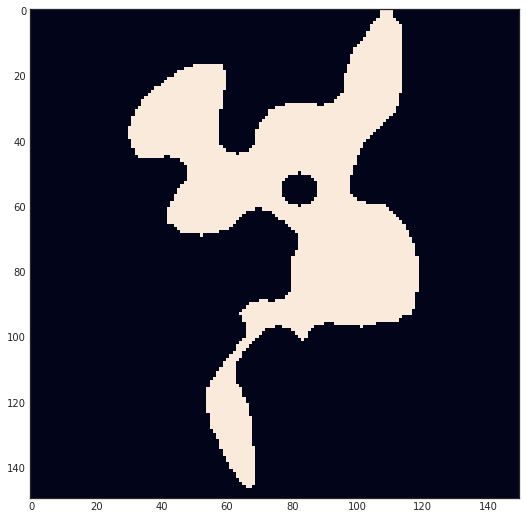

In [75]:
# Sample image

plt.imshow(np.reshape(images_grey[2000], (150, 150)))

#### 3.3.2.1 Define GaussianModel or PCA

In [46]:
# %% define GaussianModel class


class GaussianModel:
    def __init__(self, X, numBasisFunctions=10, objectPixels=None):
        '''
        inputs: 
            X                    - numSamples x numDimentions matrix
            numBasisFunctions       - number of basis function to use
            objectPixels (optional) - an binnary mask image used for presentation
                                      will be used as Im[objectPixels] = dataSample
                                      must satisfy objectPixels.ravel().sum() = X.shape[1]
        '''

        self.numBasisFunctions = numBasisFunctions
        if objectPixels is None:
            self.objectPixels = np.ones((1, X.shape[1]), dtype=np.bool)
        else:
            self.objectPixels = objectPixels
        assert (self.objectPixels.ravel().sum() == X.shape[1])

        PCAModel = decomposition.PCA(n_components=numBasisFunctions,
                                     whiten=True)
        self.dataRepresentation = PCAModel.fit_transform(X)
        self.PCAModel = PCAModel

    def RepresentUsingModel(self, X):
        return self.PCAModel.transform(X)

    def ReconstructUsingModel(self, X_transformed):
        return self.PCAModel.inverse_transform(X_transformed)

    def InterpretUsingModel(self, X):
        return self.PCAModel.inverse_transform(self.PCAModel.transform(X))

    # shows the eigenvectors of the gaussian covariance matrix
    def ShowVarianceDirections(self, numDirectionsToShow=16):
        numDirectionsToShow = min(numDirectionsToShow, self.numBasisFunctions)

        numFigRows = 4
        numFigCols = 4
        numDirectionsPerFigure = numFigRows * numFigCols
        numFigures = int(
            np.ceil(float(numDirectionsToShow) / numDirectionsPerFigure))

        for figureInd in range(numFigures):
            plt.figure()
            for plotInd in range(numDirectionsPerFigure):
                eigVecInd = numDirectionsPerFigure * figureInd + plotInd
                if eigVecInd >= self.numBasisFunctions:
                    break
                deltaImage = np.zeros(np.shape(self.objectPixels))
                deltaImage[self.objectPixels] = self.PCAModel.components_[
                    eigVecInd, :].ravel()

                plt.subplot(numFigRows, numFigCols, plotInd + 1)
                if np.shape(self.objectPixels)[0] == 1:
                    plt.plot(deltaImage)
                else:
                    plt.imshow(deltaImage, cmap='jet')
                    plt.axis('off')
                titleStr = str(
                    100 *
                    self.PCAModel.explained_variance_ratio_[eigVecInd])[0:5]
                plt.title(titleStr + '% explained')
            plt.tight_layout()

    # shows several random model reconstructions
    def ShowReconstructions(self, X, numReconstructions=5):
        assert (np.shape(X)[1] == self.objectPixels.ravel().sum())
        numSamples = np.shape(X)[0]
        numReconstructions = min(numReconstructions, numSamples)

        originalImage = np.zeros(np.shape(self.objectPixels))
        reconstructedImage = np.zeros(np.shape(self.objectPixels))

        numReconstructionsPerFigure = min(5, numReconstructions)
        numFigures = int(
            np.ceil(float(numReconstructions) / numReconstructionsPerFigure))

        for figureInd in range(numFigures):
            plt.figure()
            for plotCol in range(numReconstructionsPerFigure):
                dataSampleInd = np.random.randint(numSamples)
                originalImage[self.objectPixels] = X[dataSampleInd, :].ravel()
                reconstructedImage[self.objectPixels] = \
                    self.InterpretUsingModel(np.reshape(
                        X[dataSampleInd, :], [1, -1])).ravel()
                diffImage = abs(originalImage - reconstructedImage)

                # original image
                plt.subplot(3, numReconstructionsPerFigure,
                            0 * numReconstructionsPerFigure + plotCol + 1)
                if np.shape(self.objectPixels)[0] == 1:
                    plt.plot(originalImage)
                    plt.title('original signal')
                else:
                    plt.imshow(originalImage, cmap='gray')
                    plt.title('original image')
                    plt.axis('off')

                # reconstred image
                plt.subplot(3, numReconstructionsPerFigure,
                            1 * numReconstructionsPerFigure + plotCol + 1)
                if np.shape(self.objectPixels)[0] == 1:
                    plt.plot(reconstructedImage)
                    plt.title('reconstructed signal')
                else:
                    plt.imshow(reconstructedImage, cmap='gray')
                    plt.title('reconstructed image')
                    plt.axis('off')

                # diff image
                plt.subplot(3, numReconstructionsPerFigure,
                            2 * numReconstructionsPerFigure + plotCol + 1)
                if np.shape(self.objectPixels)[0] == 1:
                    plt.plot(diffImage)
                    plt.title('abs difference signal')
                else:
                    plt.imshow(diffImage, cmap='gray')
                    plt.title('abs difference image')
                    plt.axis('off')
            plt.tight_layout()

    # shows distrbution along the variance directions and several images along that variance direction
    def ShowModelVariations(self, numVariations=5):

        showAsTraces = (np.shape(self.objectPixels)[0] == 1)
        numVariations = min(numVariations, self.numBasisFunctions)

        numVarsPerFigure = min(5, numVariations)
        numFigures = int(np.ceil(float(numVariations) / numVarsPerFigure))

        lowRepVec = np.percentile(self.dataRepresentation, 2, axis=0)
        medianRepVec = np.percentile(self.dataRepresentation, 50, axis=0)
        highRepVec = np.percentile(self.dataRepresentation, 98, axis=0)

        for figureInd in range(numFigures):
            plt.figure()
            for plotCol in range(numVarsPerFigure):
                eigVecInd = numVarsPerFigure * figureInd + plotCol
                if eigVecInd >= self.numBasisFunctions:
                    break

                # create the low and high precentile representation activation vectors
                currLowPrecentileRepVec = medianRepVec.copy()
                currLowPrecentileRepVec[eigVecInd] = lowRepVec[eigVecInd]
                currHighPrecentileRepVec = medianRepVec.copy()
                currHighPrecentileRepVec[eigVecInd] = highRepVec[eigVecInd]

                # create blank images
                deltaImage = np.zeros(np.shape(self.objectPixels))
                medianImage = np.zeros(np.shape(self.objectPixels))
                lowPrecentileImage = np.zeros(np.shape(self.objectPixels))
                highPrecentileImage = np.zeros(np.shape(self.objectPixels))

                # fill the object pixels with the relevant data
                deltaImage[self.objectPixels] = \
                    self.PCAModel.components_[eigVecInd, :].ravel()
                lowPrecentileImage[self.objectPixels] = \
                    self.ReconstructUsingModel(currLowPrecentileRepVec).ravel()
                medianImage[self.objectPixels] = \
                    self.ReconstructUsingModel(medianRepVec).ravel()
                highPrecentileImage[self.objectPixels] = \
                    self.ReconstructUsingModel(
                        currHighPrecentileRepVec).ravel()

                # calculate the Gaussian smoothed distribution of values along the eignevector direction
                sigmaOfKDE = 0.12
                pdfStart = min(
                    self.dataRepresentation[:, eigVecInd]) - 3 * sigmaOfKDE
                pdfStop = max(
                    self.dataRepresentation[:, eigVecInd]) + 3 * sigmaOfKDE
                xAxis = np.linspace(pdfStart, pdfStop, 200)
                PDF_Model = KernelDensity(
                    kernel='gaussian', bandwidth=sigmaOfKDE).fit(
                        self.dataRepresentation[:, eigVecInd].reshape(-1, 1))
                logPDF = PDF_Model.score_samples(xAxis.reshape(-1, 1))

                # show distribution of current component
                plt.subplot(5, numVarsPerFigure,
                            0 * numVarsPerFigure + plotCol + 1)
                plt.fill(xAxis, np.exp(logPDF), fc='b')
                percentExplainedString = str(
                    100 *
                    self.PCAModel.explained_variance_ratio_[eigVecInd])[0:5]
                plt.title(percentExplainedString + '% explained')

                # show variance direction (eigenvector)
                plt.subplot(5, numVarsPerFigure,
                            1 * numVarsPerFigure + plotCol + 1)
                if showAsTraces:
                    plt.plot(deltaImage)
                    plt.title('eigenvector ' + str(eigVecInd))
                else:
                    plt.imshow(deltaImage, cmap='jet')
                    plt.title('eigenvector ' + str(eigVecInd))
                    plt.axis('off')

                # show 2nd precentile image
                plt.subplot(5, numVarsPerFigure,
                            2 * numVarsPerFigure + plotCol + 1)
                if showAsTraces:
                    plt.plot(lowPrecentileImage)
                    plt.title('2nd precentile')
                else:
                    plt.imshow(lowPrecentileImage, cmap='gray')
                    plt.title('2nd precentile image')
                    plt.axis('off')

                # show median image
                plt.subplot(5, numVarsPerFigure,
                            3 * numVarsPerFigure + plotCol + 1)
                if showAsTraces:
                    plt.plot(medianImage)
                    plt.title('median signal')
                else:
                    plt.imshow(medianImage, cmap='gray')
                    plt.title('median Image')
                    plt.axis('off')

                # show 98th precentile image
                plt.subplot(5, numVarsPerFigure,
                            4 * numVarsPerFigure + plotCol + 1)
                if showAsTraces:
                    plt.plot(highPrecentileImage)
                    plt.title('98th precentile')
                else:
                    plt.imshow(highPrecentileImage, cmap='gray')
                    plt.title('98th precentile image')
                    plt.axis('off')
            plt.tight_layout()

    # shows distrbution along the variance directions and several images along that variance direction
    def ShowSingleComponentVariation(self, X, listOfComponents=[0, 1]):

        showAsTraces = (np.shape(self.objectPixels)[0] == 1)
        assert (all(
            [(x in range(self.numBasisFunctions)) for x in listOfComponents]))

        X_rep = self.RepresentUsingModel(X)

        percentilesToShow = [1, 20, 40, 60, 80, 99]
        numReadDataSamplePerPercentile = 4
        representationPercentiles = []
        for percentile in percentilesToShow:
            representationPercentiles.append(
                np.percentile(
                    self.dataRepresentation, percentile, axis=0))
        medianRepVec = np.percentile(self.dataRepresentation, 50, axis=0)

        for eigVecInd in listOfComponents:
            plt.figure()
            gs = gridspec.GridSpec(numReadDataSamplePerPercentile + 2,
                                   len(percentilesToShow))

            # calculate the Gaussian smoothed distribution of values along the eignevector direction
            sigmaOfKDE = 0.12
            pdfStart = min(self.dataRepresentation[:,
                                                   eigVecInd]) - 3 * sigmaOfKDE
            pdfStop = max(self.dataRepresentation[:,
                                                  eigVecInd]) + 3 * sigmaOfKDE
            xAxis = np.linspace(pdfStart, pdfStop, 200)
            PDF_Model = KernelDensity(
                kernel='gaussian', bandwidth=sigmaOfKDE).fit(
                    self.dataRepresentation[:, eigVecInd].reshape(-1, 1))
            logPDF = PDF_Model.score_samples(xAxis.reshape(-1, 1))
            percentileValuesToShow = \
                [representationPercentiles[x][eigVecInd]
                    for x in range(len(representationPercentiles))]
            percentilesToShowLogPDF = \
                PDF_Model.score_samples(
                    np.array(percentileValuesToShow).reshape(-1, 1))

            # show distribution of current component and red dots at the list of precentiles to show
            plt.subplot(gs[0, :])
            plt.fill(xAxis, np.exp(logPDF), fc='b')
            plt.scatter(
                percentileValuesToShow,
                np.exp(percentilesToShowLogPDF),
                c='r',
                s=40)
            plt.title(
                str(100 * self.PCAModel.explained_variance_ratio_[eigVecInd]) +
                '% explained')

            for plotCol, currPrecentile in enumerate(percentilesToShow):
                currPrecentileRepVec = medianRepVec.copy()
                currPrecentileRepVec[eigVecInd] = representationPercentiles[
                    plotCol][eigVecInd]

                currPrecentileImage = np.zeros(np.shape(self.objectPixels))
                currPrecentileImage[self.objectPixels] = \
                    self.ReconstructUsingModel(currPrecentileRepVec).ravel()

                # show the median image with current precentile as activation of the curr image
                plt.subplot(gs[1, plotCol])
                if showAsTraces:
                    plt.plot(currPrecentileImage)
                    plt.title('precentile: ' + str(percentilesToShow[plotCol])
                              + '%')
                else:
                    plt.imshow(currPrecentileImage, cmap='gray')
                    plt.title('precentile: ' + str(percentilesToShow[plotCol])
                              + '%')
                    plt.axis('off')

                # find the most suitible candidates in X for current precentile
                distFromPercentile = abs(X_rep[:, eigVecInd] -
                                         representationPercentiles[plotCol][
                                             eigVecInd])
                X_inds = np.argpartition(distFromPercentile,
                                         numReadDataSamplePerPercentile
                                         )[:numReadDataSamplePerPercentile]
                for k, X_ind in enumerate(X_inds):
                    currNearestPrecentileImage = np.zeros(
                        np.shape(self.objectPixels))
                    currNearestPrecentileImage[self.objectPixels] = X[
                        X_ind, :].ravel()

                    plt.subplot(gs[2 + k, plotCol])
                    if showAsTraces:
                        plt.plot(currNearestPrecentileImage)
                        plt.title('NN with closest percentile')
                    else:
                        plt.imshow(currNearestPrecentileImage, cmap='gray')
                        plt.title('NN with closest percentile')
                        plt.axis('off')
            plt.tight_layout()

    def ShowDataScatterPlotsWithTSNE(self,
                                     X=None,
                                     y=None,
                                     tSNE_perplexity=30.0,
                                     colorMap='Paired'):

        if X is None:
            X_rep = self.dataRepresentation
        else:
            X_rep = self.RepresentUsingModel(X)

        if y is None:
            y = np.ones(X_rep.shape[0])

        tSNE_PCAModel = TSNE(
            n_components=2, perplexity=tSNE_perplexity, random_state=0)
        X_rep_tSNE = tSNE_PCAModel.fit_transform(X_rep)
        (tSNE_xmin, tSNE_xmax) = (np.percentile(X_rep_tSNE[:, 0], 0.3),
                                  np.percentile(X_rep_tSNE[:, 0], 99.7))
        (tSNE_ymin, tSNE_ymax) = (np.percentile(X_rep_tSNE[:, 1], 0.3),
                                  np.percentile(X_rep_tSNE[:, 1], 99.7))

        plt.figure()
        plt.subplot(1, 2, 1)
        plt.scatter(
            X_rep[:, 0], X_rep[:, 1], c=y, cmap=colorMap, s=10, alpha=0.9)
        plt.title('PCA representation')
        plt.xlabel('PC1 coeff')
        plt.ylabel('PC2 coeff')
        plt.subplot(1, 2, 2)
        plt.scatter(
            X_rep_tSNE[:, 0],
            X_rep_tSNE[:, 1],
            c=y,
            cmap=colorMap,
            s=10,
            alpha=0.9)
        plt.xlim(tSNE_xmin, tSNE_xmax)
        plt.ylim(tSNE_ymin, tSNE_ymax)
        plt.title('t-SNE representation')
        plt.xlabel('t-SNE axis1')
        plt.ylabel('t-SNE axis2')

#### 3.3.2.2 Train the GaussianModel

In [74]:
# Reshape images to be compatible with GaussianModel dimesions
# Number of images x Resize dimensions (150, 150)

images_grey_reshaped = images_grey.reshape(
    (np.shape(images_grey)[1] * np.shape(images_grey)[2]),
    np.shape(images_grey)[0]).T
print('Shape of images_grey_reshaped: ', images_grey_reshaped.shape)

# Create a boolean mask & train the model`
# Resize dimensions (150, 150)

bool_mask = np.ones((np.shape(images_grey)[1], np.shape(images_grey)[2])) == 1
print('Shape of bool_mask: ', bool_mask.shape)

# Fit the GaussianModel
leaf_pca = GaussianModel(
    images_grey_reshaped, numBasisFunctions=100, objectPixels=bool_mask)
print('GaussianModel fitted on grey images.')

Shape of images_grey_reshaped:  (4750, 22500)
Shape of bool_mask:  (150, 150)
GaussianModel fitted on grey images.


#### 3.3.2.3 Principal Components Analysis

Now let's have a look at the `main variance` directions or `vectors` which also are known as `Principal Components`. The most varying directions explain the best `discriminatory features` for the Seedlings classification task in decreasing order. Each image can be thought as `combination of different vectors` in a `high dimensional space`. 

**Visualize the most Variance Directions**

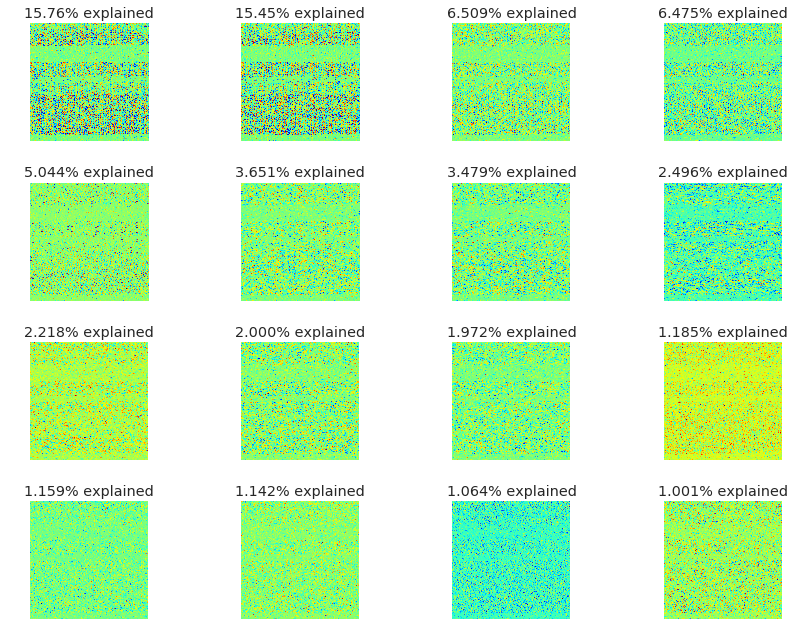

In [76]:
matplotlib.rcParams['font.size'] = 10
matplotlib.rcParams['figure.figsize'] = (12, 9)

leaf_pca.ShowVarianceDirections(numDirectionsToShow=16)

We can see some interesting shapes arising from the data especially in the first and second row.

But let's first look at some original images and how the low dimensional PCA model reconstructs them.

**Visualize images & their Reconstructions**

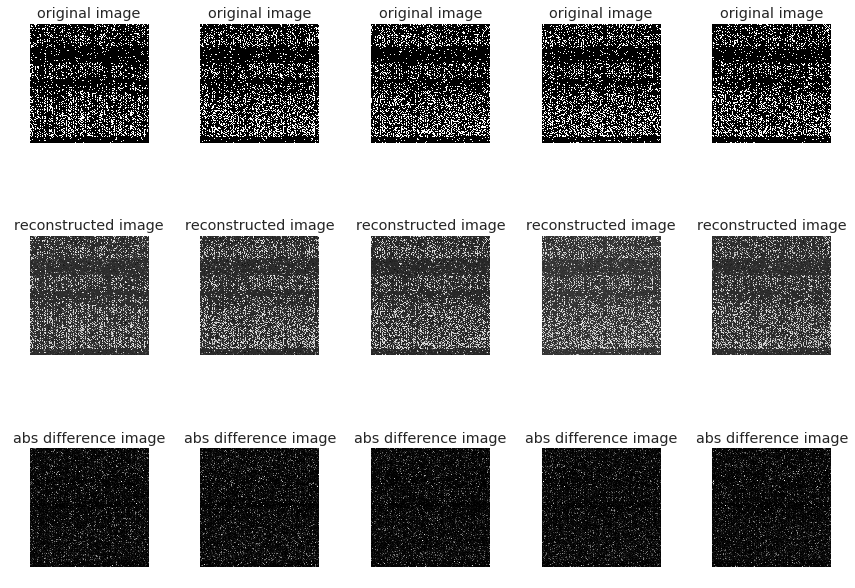

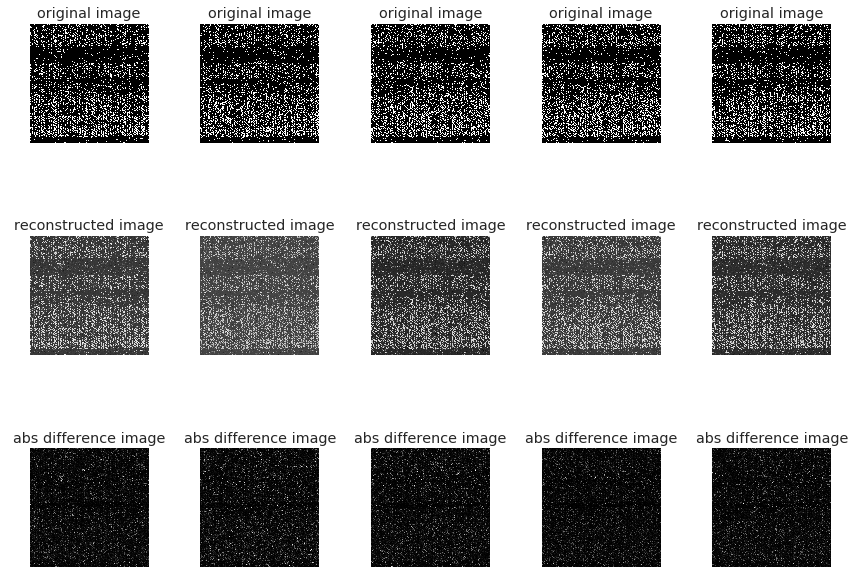

In [78]:
leaf_pca.ShowReconstructions(images_grey_reshaped, numReconstructions=10)

Looking at the absolute difference between original and reconstructed images, we notice the blurred leaf edges reconstruction using only 100 basis functions in GaussianModel.

**Show Model Variations around the Mean Image**

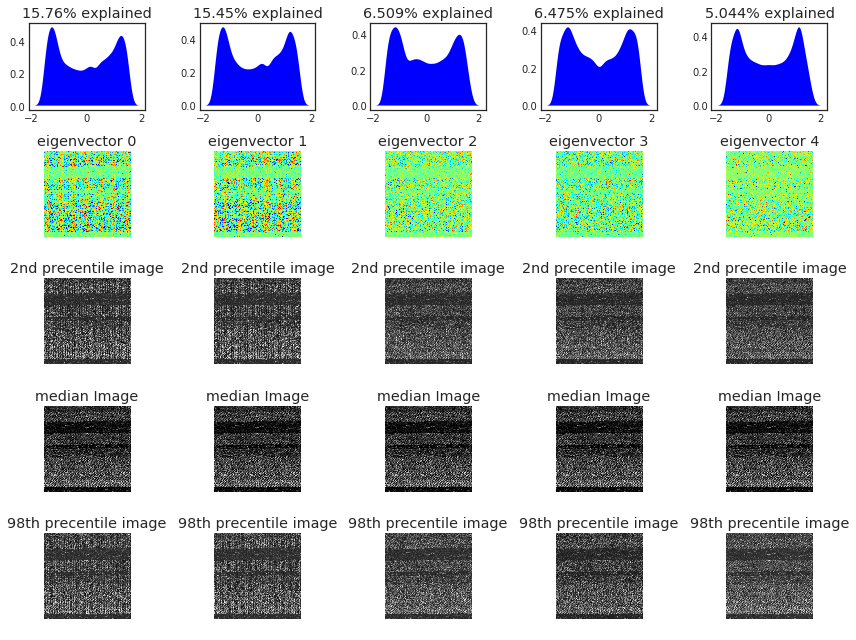

In [80]:
leaf_pca.ShowModelVariations(numVariations=5)

**Details about above plots**

- The upper most row contains the data distributions of each eigenvector (i.e. the histogram along that "direction")
- The second row contains what we already saw in a previous plot, what we called the variance directions.
- The forth row contains the median image of leafs. notice that this row is identical for all eigenvectors
- The third row holds the 2nd percentile images of each eigenvector. It's easier to think of this as the median image minus the eigenvector image multiplied by some constant.

>The constant is chosen to show the varying degree of influence of this specific eigenvector on the "average" image, so we can visualize what type of variation this particular eigenvector tends to capture. The 2nd percentile will subtract a relatively large absolute value from the median image, showing us what images look like when this coefficient is highly negative. The 98th percentile would be just the opposite, showing us what images look like when this coefficient is at the upper end of the range. The 50th percentile would give us a "middle of the road" effect of this coefficient.


----------


This plot helps us visualize what a direction in this high dimensional image space means. 

For example:

 - **The first eigenvector** (leftmost column), we can see
   that it **controls the difference between large radius leafs and small radius
   leafs**. i.e we can say that some of the variance along the change of leaf radius is explained by this component.
 - The **second eigenvector** (second column from the left) controls the difference between an
   **upright vetrically oriented leaf** and a **horizontally oriented leaf**.

**Eigen Vector I**

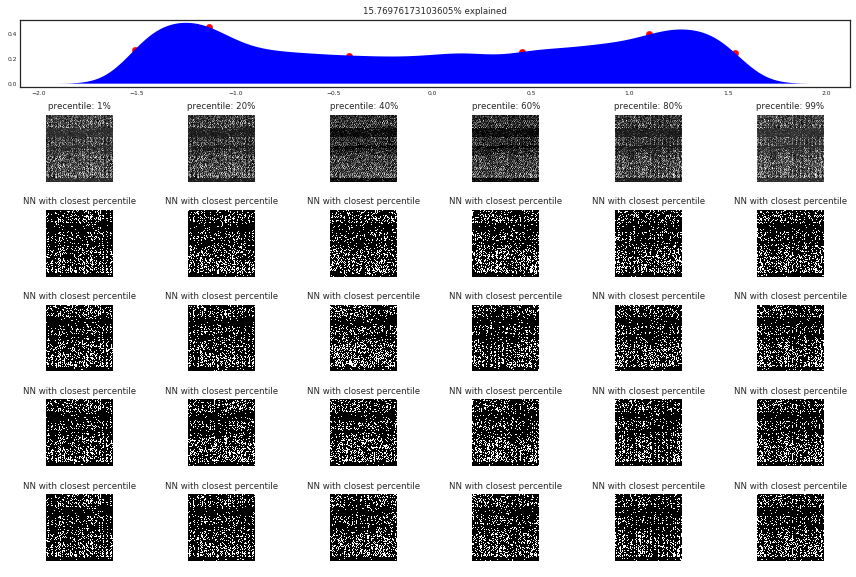

In [86]:
matplotlib.rcParams['font.size'] = 6
matplotlib.rcParams['figure.figsize'] = (12, 8)

leaf_pca.ShowSingleComponentVariation(
    images_grey_reshaped, listOfComponents=[0])

Lets explain what we see:

 - The first row shows the data distribution of the coefficients along this main variance direction. the red dots correspond to 1st, 20th, 40th, 60th, 80th and 99th percentiles of this distribution.
 - The second row is like the columns were in the previous plot. for example, we can see here in this particular case a gradual increase in leaf size from left to right.
 - The bottom 4 rows at each column hold real leaf images that have the first PCA coefficient be at the value of the corresponding percentile  of that column. for example, the left most 4 bottom pictures are leafs with a PC1 coefficient to be approximately -1.6 and the right most 4 bottom pictures are leafs with a PC1 coefficient to be approximately 2.7

By examining the the leafs that have different coefficients **we can see what this component coefficient represents**.  from the point of view of this particular component, the leaf images in the same column are very similar. we can therefore see what this particular feature "thinks" about similar leafs.

In this particular case we can see that it's about **leaf size** since we see **a gradual increase in leaf size from left to right**.

**Eigen Vector II**

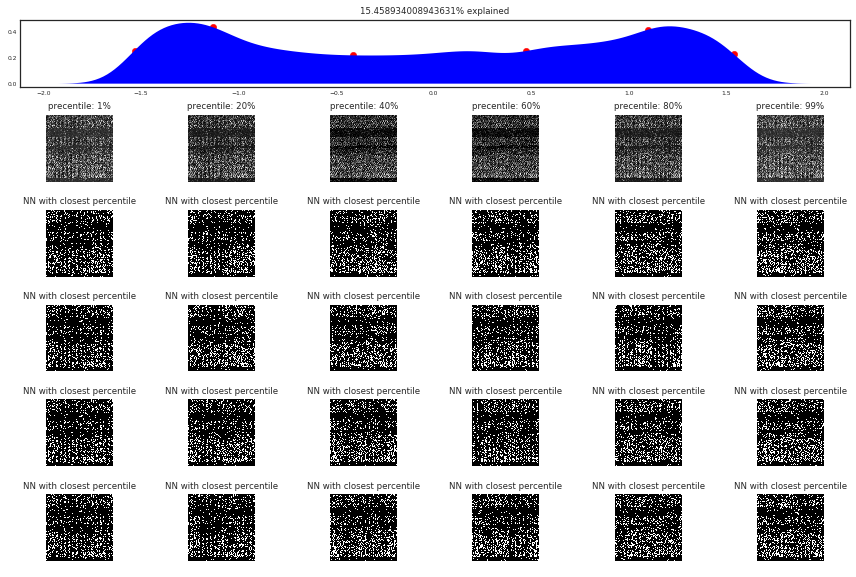

In [87]:
matplotlib.rcParams['font.size'] = 6
matplotlib.rcParams['figure.figsize'] = (12, 8)

leaf_pca.ShowSingleComponentVariation(
    images_grey_reshaped, listOfComponents=[1])

Here we can see that the second principal component is about explaining the difference between vertical and horizontal leafs.

**PCA & t-SNE Visualization**

Let's visualize seedlings leaves using `scatter plot` as we have some understanding about the eigen vectors & their distributions.

1. Using the **first two principal component coeffients**.
2. Using **2D approximation with t-SNE**.

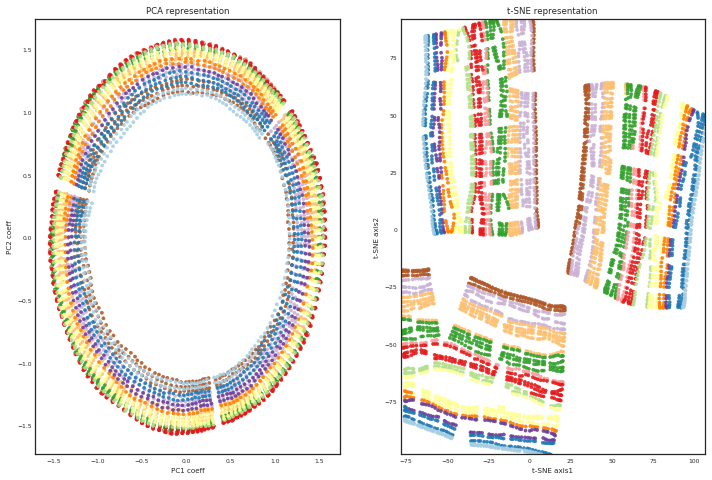

In [93]:
leaf_pca.ShowDataScatterPlotsWithTSNE(
    images_grey_reshaped, labels_grey_ids, tSNE_perplexity=10.0)

Similar leaves should be clustered in nearby regions.

#### 3.3.2.4 Fit models on different numbers of PCA

Now let's see how the classifiation `accuracy` changes across different models after `varying` number of `Principal Components`.

Text(0.5,1,'Accuracy as function of num PCs')

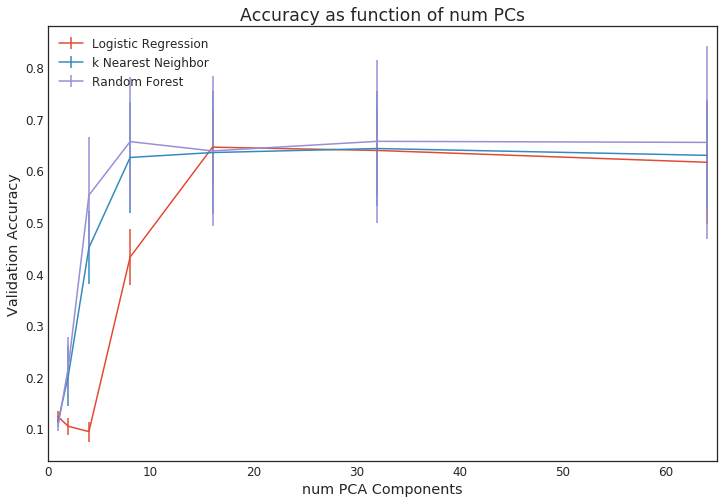

In [97]:
# Plot CV classification accuracy as function of num components used for 3 very different type of classifiers

matplotlib.rcParams['font.size'] = 12
matplotlib.rcParams['figure.figsize'] = (12, 8)

X_PCA = leaf_pca.RepresentUsingModel(images_grey_reshaped)

X_PCA_train = X_PCA
y_train = labels_grey_ids

numPCsToUse = [1, 2, 4, 8, 16, 32, 64]

logReg = LogisticRegression(C=10.0)
kNN = KNeighborsClassifier(n_neighbors=7)
RF = RandomForestClassifier(n_estimators=100)

logRegMeanAccuracy = []
kNN_MeanAccuracy = []
RF_MeanAccuracy = []
logRegAccuracyStd = []
kNN_AccuracyStd = []
RF_AccuracyStd = []

for numPCs in numPCsToUse:

    stratifiedCV = StratifiedKFold(n_splits=5, random_state=21)
    logRegAccuracy = []
    kNN_Accuracy = []
    RF_Accuracy = []

    for trainInds, validInds in stratifiedCV.split(X_PCA_train, y_train):
        X_train_cv = X_PCA_train[trainInds, :numPCs]
        X_valid_cv = X_PCA_train[validInds, :numPCs]

        y_train_cv = y_train[trainInds]
        y_valid_cv = y_train[validInds]

        logReg.fit(X_train_cv, y_train_cv)
        kNN.fit(X_train_cv, y_train_cv)
        RF.fit(X_train_cv, y_train_cv)

        logRegAccuracy.append(
            accuracy_score(y_valid_cv, logReg.predict(X_valid_cv)))
        kNN_Accuracy.append(
            accuracy_score(y_valid_cv, kNN.predict(X_valid_cv)))
        RF_Accuracy.append(accuracy_score(y_valid_cv, RF.predict(X_valid_cv)))

    logRegMeanAccuracy.append(np.array(logRegAccuracy).mean())
    logRegAccuracyStd.append(np.array(logRegAccuracy).std())

    kNN_MeanAccuracy.append(np.array(kNN_Accuracy).mean())
    kNN_AccuracyStd.append(np.array(kNN_Accuracy).std())

    RF_MeanAccuracy.append(np.array(RF_Accuracy).mean())
    RF_AccuracyStd.append(np.array(RF_Accuracy).std())

plt.figure()
plt.errorbar(x=numPCsToUse, y=logRegMeanAccuracy, yerr=logRegAccuracyStd)
plt.errorbar(x=numPCsToUse, y=kNN_MeanAccuracy, yerr=kNN_AccuracyStd)
plt.errorbar(x=numPCsToUse, y=RF_MeanAccuracy, yerr=RF_AccuracyStd)
plt.xlim(min(numPCsToUse) - 1, max(numPCsToUse) + 1)
plt.legend(
    ['Logistic Regression', 'k Nearest Neighbor', 'Random Forest'], loc=2)
plt.xlabel('num PCA Components')
plt.ylabel('Validation Accuracy')
plt.title('Accuracy as function of num PCs')

Overall, it's evident that all the classifiers achieve similar performance approximately.

But it's interesting to note different behaviors of the classifiers as a function of number of Principal Components used. 

### 3.3.3 t-SNE Visualization

In [72]:
print('Images Shape')
print('Before Scaling:', images.shape)

# Let's scale images using StandardScaler

images_scaled = StandardScaler().fit_transform(images)
print('After Scaling:', images_scaled.shape)
print('\nLabels Shape:', label_ids.shape)

Images Shape
Before Scaling: (4750, 2025)
After Scaling: (4750, 2025)

Labels Shape: (4750,)


Now let's do PCA using the scaled images and reduce the `dimesions` from `2025` to `180`.

In [21]:
# PCA Analysis

pca = PCA(n_components=180)
pca_result = pca.fit_transform(images_scaled)

In [22]:
pca_result.shape

(4750, 180)

In [23]:
# TSNE Analysis

tsne = TSNE(n_components=2, perplexity=40.0)
tsne_result = tsne.fit_transform(pca_result)

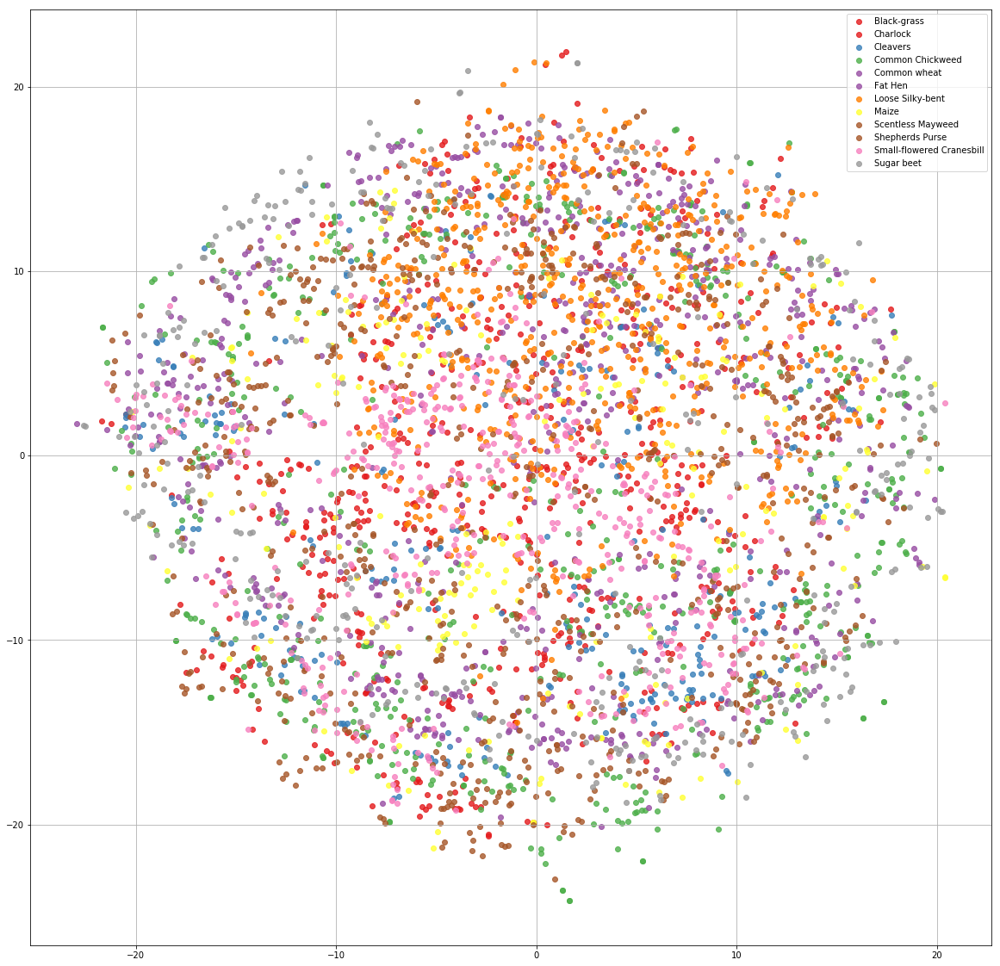

In [39]:
# Visualize seedlings clusters in a scatter plot

visualize_scatter(tsne_result, label_ids)

In [24]:
# Let's scale images using StandardScaler

tsne_result_scaled = StandardScaler().fit_transform(tsne_result)
tsne_result_scaled.shape

(4750, 2)

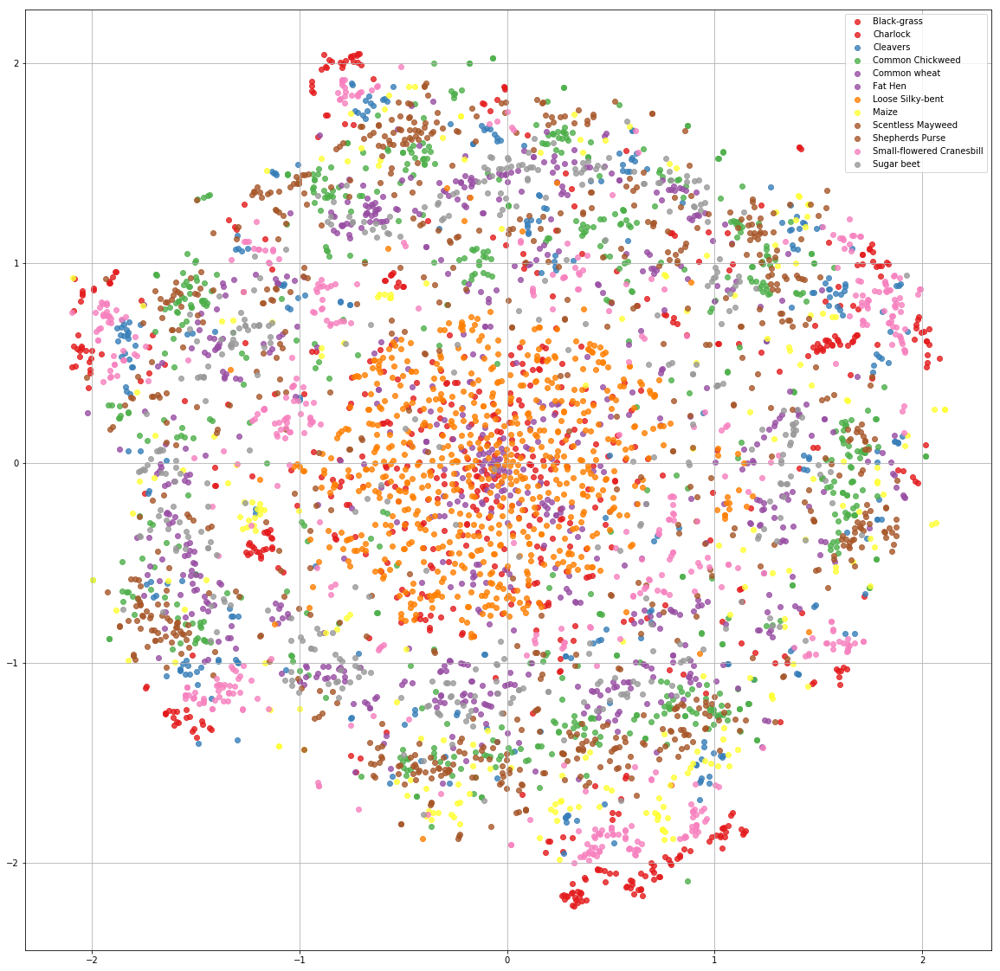

In [25]:
# Visualize seedlings clusters in a scatter plot

visualize_scatter(tsne_result_scaled, label_ids)

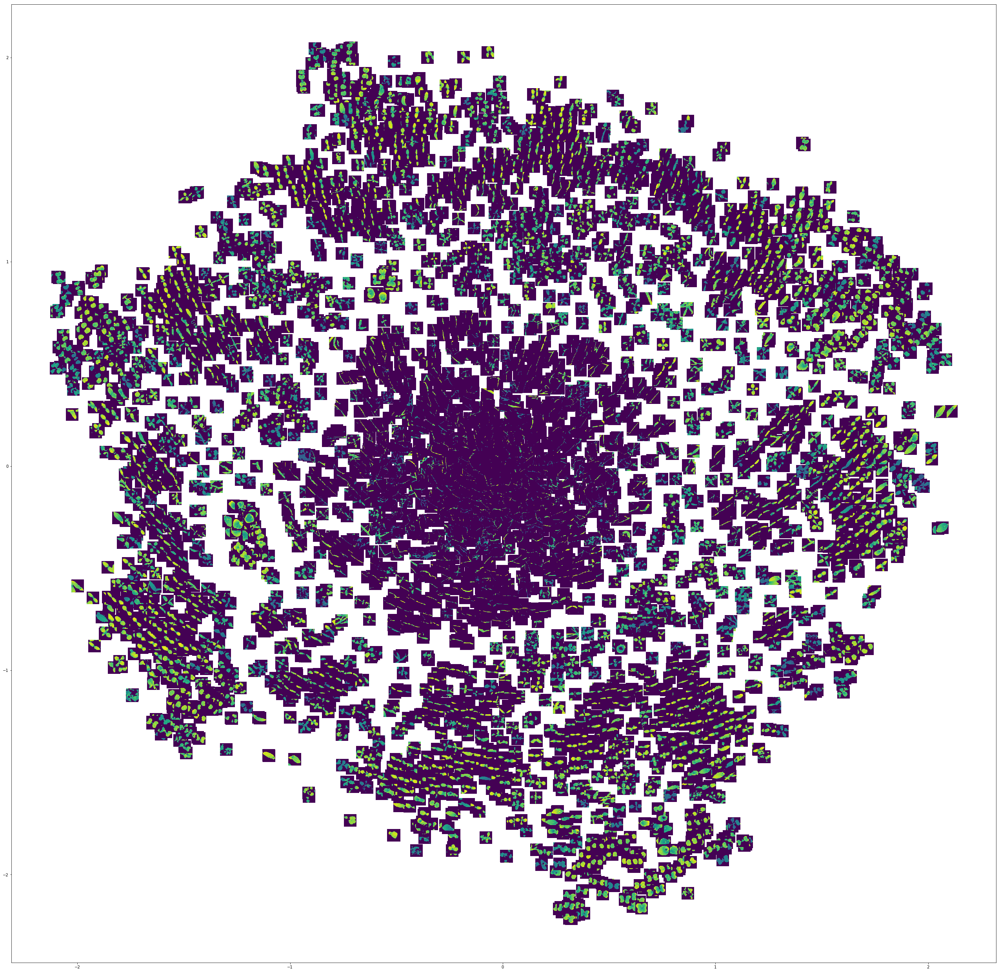

In [26]:
# Visualize seedlings clusters in a scatter plot along with images

visualize_scatter_with_images(
    tsne_result_scaled,
    images=[np.reshape(i, (45, 45)) for i in images],
    image_zoom=0.7)

### 3D t-SNE 

In [27]:
# TSNE Analysis

tsne = TSNE(n_components=3)
tsne_result = tsne.fit_transform(pca_result)
tsne_result_scaled = StandardScaler().fit_transform(tsne_result)

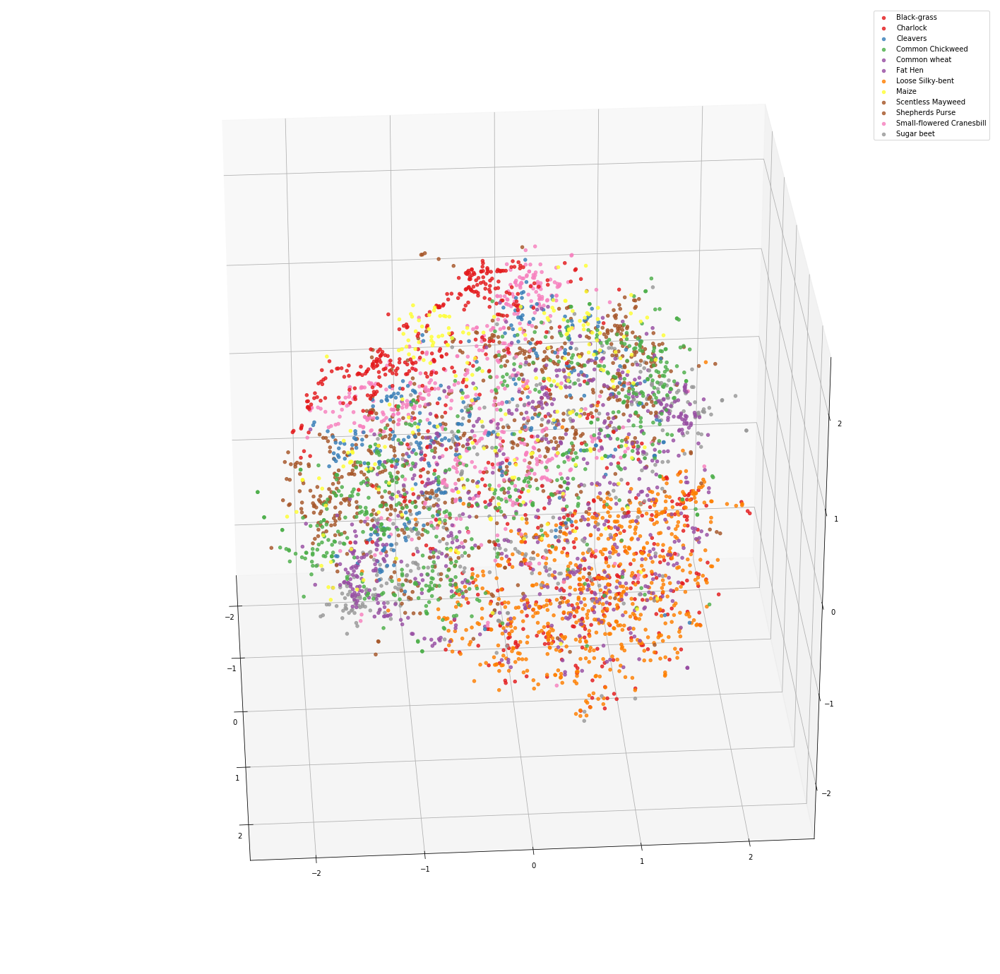

In [35]:
# Visualize seedlings clusters in a 3D scatter plot

visualize_scatter_3D(tsne_result_scaled, label_ids)

In [ ]:
# Visualize seedlings clusters in a 3D scatter plot with animation GIF

import io
import base64
from IPython.display import HTML

video = io.open(os.path.join('./visualization', 'seedlings_3D.gif'),
                'r+b').read()
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(
    base64.b64encode(video).decode('ascii')))

## 3.4 Normalization

Now we can `normalize` an image RGB color space values raning from [0...255] to [0...1]. It will `loose some discrimantory features` but CNN being compute intensive will train faster.

```python
image_norm = image/255
```

It seems that there isn't a big improvements from normalization.

# 4. Modelling

Now we are ready to train a model and predict. There are loads of predictive modelling algorithms to choose from. We must understand the type of problem and solution requirements to narrow down to a select few baseline models which we can evaluate iteratively.

Our problem falls in the supervised classification category. We want to identify the relationship between a seedling class and an input image.

With above two criteria - Supervised Learning plus Image Classification, we can narrow down our choice of models to a few which are as follow:

1. CNN
2. Transfer Learning using Xception, VGG, ImageNet
3. XGB using only countour features

## 4.1 CNN

The convolutional Neural Networks has the following strutctures.

* Input eg. (51x51x3)
1. First 64 filters
2. Second 64 filters
3. Third 128 filters
4. Fourth 128 filters
5. Fifth 256 filters
6. Sixth 256 filters
7. Seventh 256 filters
8. Eigth Dense layer 128 neurons
* Output 12 Seedling classes

Each pair of convolution layers have a max pooling layer and uses batch normalization to reduce overfitting. It also takes advantage of Leaky ReLUs. In dense layers, we will use dropout to reduce overfitting.

In the end, the fully-connected layers will be used for classification which the outputs probability distribution for each of 12 Seedling classes.

>Batch normalization is a technique to provide any layer in a neural network with inputs that are zero mean/unit variance. It is used to normalize the input layer by adjusting and scaling the activations.

>Leaky ReLUs allow a small, non-zero gradient when the unit is not active.

>Parametric ReLUs take this idea further by making the coefficient of leakage into a parameter that is learned along with the other neural network parameters.

### 4.1.1 Fixed Variables Initialization

In [6]:
BATCH_SIZE = 16
EPOCHS = 16
RANDOM_STATE = 21

# Same as label_to_id_dict

CLASS = {
    'Black-grass': 0,
    'Charlock': 1,
    'Cleavers': 2,
    'Common Chickweed': 3,
    'Common wheat': 4,
    'Fat Hen': 5,
    'Loose Silky-bent': 6,
    'Maize': 7,
    'Scentless Mayweed': 8,
    'Shepherds Purse': 9,
    'Small-flowered Cranesbill': 10,
    'Sugar beet': 11
}

# Same as id_to_label_dict

INV_CLASS = {
    0: 'Black-grass',
    1: 'Charlock',
    2: 'Cleavers',
    3: 'Common Chickweed',
    4: 'Common wheat',
    5: 'Fat Hen',
    6: 'Loose Silky-bent',
    7: 'Maize',
    8: 'Scentless Mayweed',
    9: 'Shepherds Purse',
    10: 'Small-flowered Cranesbill',
    11: 'Sugar beet'
}

### 4.1.2 Define Model Network

In [8]:
# Define Dense layers


def dense_layer(inputs, neurons, activation, drop_rate=0.):
    dropout = Dropout(drop_rate)(inputs)
    fc = Dense(neurons)(dropout)
    fc_norm = BatchNormalization(axis=-1)(fc)
    outputs = Activation(activation=activation)(fc_norm)
    return outputs


# Define Convolution layers


def conv_layer(feature_batch,
               feature_map,
               kernel_size=(3, 3),
               strides=(1, 1),
               padding=False):
    if padding:
        processed_feature_batch = ZeroPadding2D((1, 1))(feature_batch)
    else:
        processed_feature_batch = feature_batch

    conv = Conv2D(
        filters=feature_map, kernel_size=kernel_size,
        strides=strides)(processed_feature_batch)
    conv_norm = BatchNormalization(axis=3)(conv)
    outputs = LeakyReLU(1 / 10)(conv_norm)
    return outputs


# Define Model Neural Network


def model_neural_network():

    inputs = Input(shape=(51, 51, 3))

    # First, Second layer
    conv1 = conv_layer(inputs, 64, padding=False)
    conv2 = conv_layer(conv1, 64, padding=False)
    pool1 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(conv2)

    # Third, Fourth layer
    conv3 = conv_layer(pool1, 128, padding=False)
    conv4 = conv_layer(conv3, 128, padding=False)
    pool2 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(conv4)

    # Sixth, Seventh, Ninth layer
    conv7 = conv_layer(pool2, 256, padding=False)
    conv8 = conv_layer(conv7, 256, padding=False)
    conv9 = conv_layer(conv8, 256, padding=False)
    pool3 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(conv9)

    # Two Dense layers
    flattened = Flatten()(pool3)
    fc_output = dense_layer(flattened, 128, activation='tanh')
    outputs = dense_layer(fc_output, 12, activation='softmax')

    model = Model(inputs=inputs, outputs=outputs)

    # The first 50 epochs with Adam opt & then 30 epochs with SGD opt.

    #mypotim = Adam(lr=2 * 1e-3, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    mypotim = SGD(lr=1 * 1e-1, momentum=0.9, nesterov=True)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=mypotim,
        metrics=['accuracy'])
    model.summary()

    return model


# Model Callbacks


def get_callbacks(checkpoint_path, patience=5):

    if not os.path.exists('./logs'):
        os.makedirs('./logs')

    lr_reduced = ReduceLROnPlateau(
        monitor='val_acc',
        factor=0.1,
        epsilon=1e-5,
        patience=patience,
        verbose=1)
    checkpoint = ModelCheckpoint(
        checkpoint_path, monitor='val_acc', save_best_only=True, verbose=1)
    #early_stop = EarlyStopping(monitor='val_acc', patience=patience, mode='max')
    tensorboard = TensorBoard(
        log_dir='./logs',
        histogram_freq=2000,
        write_graph=True,
        write_images=True)

    return [lr_reduced, checkpoint, tensorboard]

In [8]:
train_dict = joblib.load(os.path.join('./save/pickles', 'train_dict.pickle'))
train_dict['class'][0:5]

['Sugar beet', 'Sugar beet', 'Sugar beet', 'Sugar beet', 'Sugar beet']

### 4.1.3 Training CNN Model

In [ ]:
# Define Train method


def train(img, target, best_model):

    # Setting checkpoint & early stopping
    # Load the last best checkpoint files
    callbacks_list = get_callbacks(
        checkpoint_path=os.path.join(
            './checkpoint', 'model_weight_SGD.{epoch:02d}-{val_acc:.4f}.hdf5'),
        patience=5)

    # Initialize the model neural networks architecture
    model = model_neural_network()

    # Load network weights
    if os.path.exists(os.path.join('./checkpoint', best_model)):
        print('Loading weights from previous run...', best_model)
        model.load_weights(filepath=os.path.join('./checkpoint', best_model))
    else:
        print('Weights not loaded.', best_model)

    # Split the data in train & validation set
    x_train, x_valid, y_train, y_valid = train_test_split(
        img,
        target,
        shuffle=True,
        train_size=0.8,
        stratify=target,
        random_state=RANDOM_STATE)
    # To avoide overfitting, we need to create an image generator which will randomly rotate, zoom, shift and flip image
    # during the fitting of the model.
    # Define an ImageDataGenerator
    image_gen = ImageDataGenerator(
        rotation_range=360.,
        width_shift_range=0.3,
        height_shift_range=0.3,
        zoom_range=0.3,
        horizontal_flip=True,
        vertical_flip=True)

    # Fitting the model with the image generator & others
    model.fit_generator(
        image_gen.flow(
            x_train, y_train, batch_size=BATCH_SIZE),
        steps_per_epoch=10 * len(x_train) / BATCH_SIZE,
        epochs=EPOCHS,
        verbose=1,
        shuffle=True,
        validation_data=(x_valid, y_valid),
        callbacks=callbacks_list)


# Training the model


def train_main():

    try:
        train_dict = joblib.load(
            os.path.join('./save/pickles', 'train_dict.pickle'))
        test_dict = joblib.load(
            os.path.join('./save/pickles', 'test_dict.pickle'))
        print('Loading train & test dict...')
    except Exception as e:
        print('Stacktrace', e)
        print('Train & Test Dict does not exist.')

    if (not train_dict) and (not test_dict):
        train_dict, test_dict = reader()
        # Dumping dicts
        joblib.dump(train_dict,
                    os.path.join('./save/pickles', 'train_dict.pickle'))
        joblib.dump(test_dict,
                    os.path.join('./save/pickles', 'test_dict.pickle'))

    X_train = np.array(train_dict['image'])
    y_train = to_categorical(np.array([CLASS[l] for l in train_dict['class']]))

    best_model = 'model_weight_SGD.05-0.9526.hdf5'
    train(X_train, y_train, best_model)


if __name__ == '__main__':
    train_main()

Loading train & test dict...
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 51, 51, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 49, 49, 64)        1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 49, 49, 64)        256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 49, 49, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 47, 47, 64)        36928     
_________________________________________________________________
batch_normalization_2 (Batch (None, 47, 47, 64)        256       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 47, 47, 64)

### 4.1.4 Evaluate Model

#### On Validation Set

Loading train & test dict...
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        (None, 51, 51, 3)         0         
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 49, 49, 64)        1792      
_________________________________________________________________
batch_normalization_100 (Bat (None, 49, 49, 64)        256       
_________________________________________________________________
leaky_re_lu_78 (LeakyReLU)   (None, 49, 49, 64)        0         
_________________________________________________________________
conv2d_79 (Conv2D)           (None, 47, 47, 64)        36928     
_________________________________________________________________
batch_normalization_101 (Bat (None, 47, 47, 64)        256       
_________________________________________________________________
leaky_re_lu_79 (LeakyReLU)   (None, 47, 47, 64)

,Sugar beet,Cleavers,Scentless Mayweed,Fat Hen,Common Chickweed,Loose Silky-bent,Black-grass,Charlock,Maize,Small-flowered Cranesbill,Common wheat,Shepherds Purse
Sugar beet,70,0,0,0,0,0,9,0,0,0,0,0
Cleavers,0,117,0,0,0,0,0,0,0,0,0,0
Scentless Mayweed,0,0,85,0,0,0,1,0,0,0,0,0
Fat Hen,0,0,0,183,0,0,0,0,0,0,0,0
Common Chickweed,0,0,0,0,66,0,0,0,0,0,0,0
Loose Silky-bent,0,0,0,0,0,143,0,0,0,0,0,0
Black-grass,7,0,0,0,0,0,189,0,0,0,0,0
Charlock,0,0,0,0,0,0,0,66,0,0,0,0
Maize,0,0,0,0,0,0,0,0,155,0,0,0
Small-flowered Cranesbill,0,0,0,0,0,0,0,0,0,69,0,0




Saving Confusion Matrices in the ./save/con_matrix directory


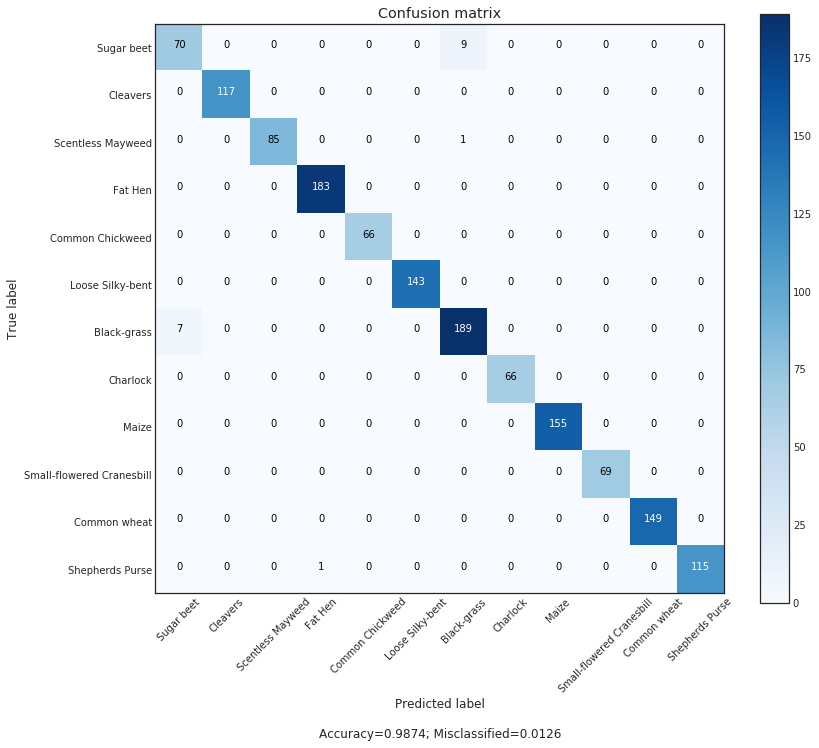



Classification Report
                           precision    recall  f1-score   support

               Sugar beet       0.91      0.89      0.90        79
                 Cleavers       1.00      1.00      1.00       117
        Scentless Mayweed       1.00      0.99      0.99        86
                  Fat Hen       0.99      1.00      1.00       183
         Common Chickweed       1.00      1.00      1.00        66
         Loose Silky-bent       1.00      1.00      1.00       143
              Black-grass       0.95      0.96      0.96       196
                 Charlock       1.00      1.00      1.00        66
                    Maize       1.00      1.00      1.00       155
Small-flowered Cranesbill       1.00      1.00      1.00        69
             Common wheat       1.00      1.00      1.00       149
          Shepherds Purse       1.00      0.99      1.00       116

              avg / total       0.99      0.99      0.99      1425



In [24]:
# Define Test method


def test_valid(X_train, x_valid, y_train, y_valid, best_model):

    # Initialize the model neural networks architecture & load weights
    model = model_neural_network()
    model.load_weights(filepath=os.path.join('./checkpoint', best_model))

    # Evaluate on train and valid set
    print('\nCalculating Train Set accuracy ...')
    train_acc = model.evaluate(
        X_train, to_categorical(np.array([CLASS[l] for l in y_train])))
    print('Train Set accuracy: {}%'.format(
        [np.round(acc * 100, 2) for acc in train_acc]))

    print('\nCalculating Valid Set accuracy ...')
    valid_acc = model.evaluate(
        x_valid, to_categorical(np.array([CLASS[l] for l in y_valid])))
    print('Valid Set accuracy: {}%'.format(
        [np.round(acc * 100, 2) for acc in valid_acc]))

    print('\nCalculating Confusion Matrix & Classification Report ...')
    # Predictions on the valid set
    prob = model.predict(x_valid, verbose=1)
    predictions = prob.argmax(axis=1)

    # True class label
    true = np.array([CLASS[l] for l in y_valid])

    # Confusion matrix on the valid set.
    con_matrix = confusion_matrix(true, predictions)

    print('\n\nConfusion matrix of the Seedlings Valid set\n\n')
    display(
        pd.DataFrame(
            con_matrix, columns=list(CLASS.keys()), index=list(CLASS.keys())))

    # Plot the confusion matrix
    plot_confusion_matrix(
        con_matrix,
        target_names=list(CLASS.keys()),
        plt_name='Seedlings_Con_Matrix',
        rootdir='./',
        save_dir='save/con_matrix',
        title='Confusion matrix',
        cmap=plt.cm.Blues,
        normalize=False)

    print('\n\nClassification Report')
    print(
        classification_report(
            true, predictions, target_names=list(CLASS.keys())))


# Testing the model on validation set


def valid_main():

    try:
        train_dict = joblib.load(
            os.path.join('./save/pickles', 'train_dict.pickle'))
        test_dict = joblib.load(
            os.path.join('./save/pickles', 'test_dict.pickle'))
        print('Loading train & test dict...')
    except Exception as e:
        print('Stacktrace', e)
        print('Train & Test Dict does not exist.')

    if (not train_dict) and (not test_dict):
        train_dict, test_dict = reader()
        # Dumping dicts
        joblib.dump(train_dict,
                    os.path.join('./save/pickles', 'train_dict.pickle'))
        joblib.dump(test_dict,
                    os.path.join('./save/pickles', 'test_dict.pickle'))

    img = np.array(train_dict['image'])
    label = train_dict['label']
    target = train_dict['class']

    # Split the data in train & validation set
    X_train, x_valid, y_train, y_valid = train_test_split(
        img,
        target,
        shuffle=True,
        train_size=0.7,
        stratify=target,
        random_state=RANDOM_STATE)

    # best_model = input('Enter the name of best model saved in ./logs dir: ')
    best_model = 'model_weight_SGD.12-0.9832.hdf5'
    test_valid(X_train, x_valid, y_train, y_valid, best_model)


if __name__ == '__main__':
    valid_main()

#### Submission on Test Set 

In [9]:
# Define Test method


def test(img, label, best_model):

    # Initialize the model neural networks architecture & load weights
    model = model_neural_network()
    model.load_weights(filepath=os.path.join('./checkpoint', best_model))

    # Predictions
    prob = model.predict(img, verbose=1)
    pred = prob.argmax(axis=-1)

    submission_df = pd.DataFrame({
        "file": label,
        "species": [INV_CLASS[p] for p in pred]
    })
    submission_df.to_csv(
        os.path.join('./save', 'submission.csv'), index=False, header=True)


# Testing the model


def test_main():

    try:
        test_dict = joblib.load(
            os.path.join('./save/pickles', 'test_dict.pickle'))
        print('Loading dict...')
    except Exception as e:
        print('Stacktrace', e)
        print('Test Dict does not exist.')

    if not test_dict:
        _, test_dict = reader()

    X_test = np.array(test_dict['image'])
    label = test_dict['label']

    best_model = input('Enter the name of best model saved in ./logs dir: ')
    test(X_test, label, best_model)


if __name__ == '__main__':
    test_main()

Loading dict...


Enter the name of best model saved in ./logs dir:  model_weight_SGD.12-0.9832.hdf5


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 51, 51, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 49, 49, 64)        1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 49, 49, 64)        256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 49, 49, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 47, 47, 64)        36928     
_________________________________________________________________
batch_normalization_2 (Batch (None, 47, 47, 64)        256       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 47, 47, 64)        0         
__________

## 4.2 Transfer Learning using Xception, VGG, ImageNet

Use Keras Pretrained Models

In [12]:
%ls ../../models/keras-pretrained-models

imagenet_class_index.json
inception_resnet_v2_weights_tf_dim_ordering_tf_kernels.h5
inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5
inception_v3_weights_tf_dim_ordering_tf_kernels.h5
inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Kuszma.JPG
resnet50_weights_tf_dim_ordering_tf_kernels.h5
resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
xception_weights_tf_dim_ordering_tf_kernels.h5
xception_weights_tf_dim_ordering_tf_kernels_notop.h5


#### Helper Functions to load Seedlings data

In [102]:
# Load test seedlings data & return images, labels, image_per_class


def load_seedlings_transfer(path=os.path.join(root_dir, 'train'),
                            img_size=(299, 299)):
    images = []
    labels = []
    images_per_class = defaultdict(list)

    for class_folder_name in os.listdir(path):
        class_folder_path = os.path.join(path, class_folder_name)

        for image_path in glob(os.path.join(class_folder_path, "*.png")):
            # Read an image
            image = cv2.imread(image_path, cv2.IMREAD_COLOR)

            # Stats for each seedlings class
            images_per_class[class_folder_name].append(image)

            # Resize image to img_size pixels
            image = cv2.resize(image, img_size, interpolation=cv2.INTER_AREA)

            images.append(image)
            labels.append(class_folder_name)

    images = np.array(images)
    labels = np.array(labels)

    return images, labels, images_per_class


# Load test seedlings data & return images, ids


def load_seedlings_transfer_test(path=os.path.join(root_dir, 'test'),
                                 img_size=(299, 299)):
    images = []
    ids = []

    for image_path in glob(os.path.join(path, "*.png")):
        # Read an image
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)

        # Resize image to img_size pixels
        image = cv2.resize(image, img_size, interpolation=cv2.INTER_AREA)

        images.append(image)
        ids.append(os.path.basename(image_path))

    images = np.array(images)
    ids = np.array(ids)

    return images, ids

In [79]:
ls data/all/

sample_submission.csv  test/  test.zip  train/  train.zip


### 4.2.1 Xception Model

#### 4.2.1.1 Prepare & Load Data

The `Xception` model `input` dimesions are `299 * 299 * 3`. Hence we need to prepare images satisfying the dimensional requirements.

In [7]:
# Constants

input_dim = 299
POOLING = 'avg'
RANDOM_STATE = 21

In [9]:
images_xception = np.array([])

try:
    print('Loading Images & Labels dict ...')
    images_xception = joblib.load(os.path.join(
        './save/pickles', 'images-xception.pickle'))
    labels = joblib.load(os.path.join(
        './save/pickles', 'labels-xception.pickle'))
    print('Loading done.')
except Exception as e:
    print('Stacktrace', e)
    print('Images & Labels dict does not exist.')

if not (images_xception.size):
    img_size = (299, 299)
    print('Running load_seedlings method with img_size {} ...'.format(img_size))
    images_xception, labels, images_per_class = load_seedlings_transfer(
        img_size=img_size)

    print('Dumping Images & Labels dict ...')
    # Dumping dicts
    joblib.dump(images_xception, os.path.join(
        './save/pickles', 'images-xception.pickle'))
    joblib.dump(labels, os.path.join(
        './save/pickles', 'labels-xception.pickle'))
    print('Images & Labels dict dumping done.')

Loading Images, Labels & images_per_class dict ...
Loading done.


In [11]:
# Type cast int to float for Xception model compatibility

images_xception = images_xception.astype(dtype='float32', copy=False)

print('Images Shape:', images_xception.shape)
print('Image Data Type:', images_xception[0].dtype)
print('Labels Shape:', labels.shape)
print('Label Data Type:', labels[0].dtype)

Images Shape: (4750, 299, 299, 3)
Image Data Type: float32
Labels Shape: (4750,)
Label Data Type: <U10


#### 4.2.1.2 Extract Xception Bottleneck Features

In [12]:
%time

# Numpy array to store extracted features from Xception model
images_xception_features = np.zeros(
    (len(images_xception), input_dim, input_dim, 3), dtype='float32')

# Extract features with Xception model
for i, image in tqdm(enumerate(images_xception)):
    x = xception.preprocess_input(np.expand_dims(image, axis=0))
    images_xception_features[i] = x

print('Train Images shape: {} size: {:,}'.format(
    images_xception_features.shape, images_xception_features.size))

print('Dumping images_xception_features ...')
joblib.dump(images_xception_features, os.path.join(
    './save/pickles', 'images_xception_features.pickle'))
print('images_xception_features dumping done.')

126it [00:00, 1254.04it/s]

CPU times: user 1 µs, sys: 1 µs, total: 2 µs
Wall time: 3.81 µs


4750it [00:02, 1652.94it/s]

Train Images shape: (4750, 299, 299, 3) size: 1,273,964,250


In [8]:
del images_xception_features, labels

In [49]:
try:
    print('Loading images_xception_features & Labels ...')
    images_xception_features = joblib.load(os.path.join(
        './save/pickles', 'images_xception_features.pickle'))
    labels = joblib.load(os.path.join(
        './save/pickles', 'labels-xception.pickle'))
    print('Loading done.')
except Exception as e:
    print('Stacktrace', e)
    print('images_xception_features & Labels does not exist.')


# Split the data in train & validation set
x_train, x_valid, y_train, y_valid = train_test_split(
    images_xception_features,
    labels,
    shuffle=True,
    train_size=0.8,
    stratify=labels,
    random_state=RANDOM_STATE
)

del images_xception_features, labels

# Xception V1 model, with weights pre-trained on ImageNet. On ImageNet, this model gets to
# a top-1 validation accuracy of 0.790 and a top-5 validation accuracy of 0.945. Note that this
# model only supports the data format 'channels_last' (height, width, channels).
# The default input size for this model is 299x299.

xception_bottleneck = xception.Xception(
    weights='imagenet', include_top=False, pooling=POOLING)

# Calculating Xception train & valid set bottleneck features
x_train_botf = xception_bottleneck.predict(x_train, batch_size=32, verbose=1)
x_valid_botf = xception_bottleneck.predict(x_valid, batch_size=32, verbose=1)

print('Xception train bottleneck features shape: {} size: {:,}'.format(
    x_train_botf.shape, x_train_botf.size))
print('Xception valid bottleneck features shape: {} size: {:,}'.format(
    x_valid_botf.shape, x_valid_botf.size))

# Dumping Xception train & valid set bottleneck features
joblib.dump(x_train_botf, os.path.join(
    './save/pickles', 'x_train_botf.pickle'))
joblib.dump(x_valid_botf, os.path.join(
    './save/pickles', 'x_valid_botf.pickle'))

joblib.dump(y_train, os.path.join('./save/pickles', 'y_train_botf.pickle'))
joblib.dump(y_valid, os.path.join('./save/pickles', 'y_valid_botf.pickle'))
print('Dumping Xception train & valid set bottleneck features & labels done.')

Loading images_xception_features & Labels ...
Loading done.
950/950 [==============================] - 443s 467ms/step
Xception train bottleneck features shape: (3800, 2048) size: 7,782,400
Xception valid bottleneck features shape: (950, 2048) size: 1,945,600
Dumping Xception train & valid set bottleneck features done.


#### 4.2.1.3 Logistic Regression on Xception Bottleneck Features

In [15]:
# Logistic Regression classifier

logreg = LogisticRegression(
    multi_class='multinomial', solver='lbfgs', random_state=RANDOM_STATE)
logreg.fit(x_train_botf, y_train)

valid_probs = logreg.predict_proba(x_valid_botf)
valid_preds = logreg.predict(x_valid_botf)

In [19]:
print('Logistic Regression model Accuracy on valid set using Xception Bottleneck Features: {}%'.format(
    np.round(accuracy_score(y_valid, valid_preds)*100, 2)))

Logistic Regression model Accuracy on valid set using Xception Bottleneck Features: 87.26%


**Confusion Matrix**

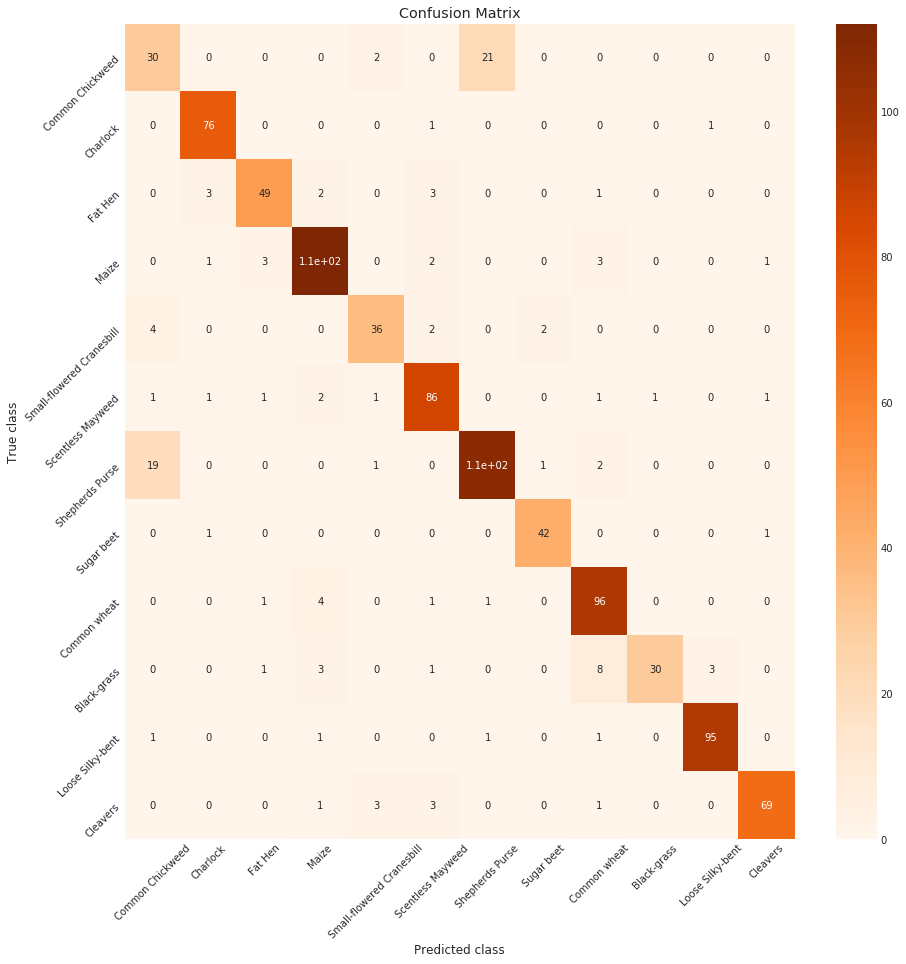

In [22]:
con_matrix = confusion_matrix(y_valid, valid_preds)

# Plot confusion matrix using seaborn heatmap

fig, ax = plt.subplots(1, figsize=(15, 15))

ax = sns.heatmap(con_matrix, ax=ax, cmap=plt.cm.Oranges, annot=True)

ax.set_xticklabels(list(CLASS.keys()), rotation=45)
ax.set_yticklabels(list(CLASS.keys()), rotation=45)

plt.xlabel('Predicted class')
plt.ylabel('True class')
plt.title('Confusion Matrix')

fig.savefig(os.path.join('./save/con_matrix',
                         'Seedlings_logreg_Confusion_Matrix.png'), dpi=300)
plt.show()

#### 4.2.1.4 Classifier Comparison

After fitting our train dataset on `Xception Bottleneck Features`, you can run a general Classifier Comparison module containing sklearn classifers with vanilla configurations.

In [29]:
% % time


def classifier_comparison(n_splits=3):
    # Classifier names & initializations
    names = ["Nearest Neighbors", "SVM", "Gaussian Process",
             "Decision Tree", "Random Forest", "Neural Net", "AdaBoost", "GradientBoost"
             "Naive Bayes", "LDA", "QDA", "XGB Classifier"]

    classifiers = [
        KNeighborsClassifier(3),
        SVC(probability=True),
        GaussianProcessClassifier(),
        DecisionTreeClassifier(),
        RandomForestClassifier(),
        MLPClassifier(),
        AdaBoostClassifier(),
        GradientBoostingClassifier(),
        GaussianNB(),
        LinearDiscriminantAnalysis(),
        QuadraticDiscriminantAnalysis(),
        XGBClassifier()]

    # Split & shuffle data using Stratified K Fold
    kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=21)

    # Calculate accuracy over all splits, classifiers
    count = 0
    acc_dict = defaultdict(list)
    for train_index, test_index in kfold.split(x_train_botf, y_train):
        xtrain, ytrain = x_train_botf[train_index], y_train[train_index]
        xtest, ytest = x_train_botf[test_index], y_train[test_index]
        print('Iteration: ', count)

        # iterate over classifiers
        for clf in classifiers:
            clf_name = clf.__class__.__name__
            clf.fit(xtrain, ytrain)
            predictions = clf.predict(xtest)
            accuracy = accuracy_score(ytest, predictions)

            # Append results in default dict of lists
            acc_dict[clf_name].append(accuracy)

        count += 1

    return acc_dict


# Call the classifier_comparison module & save the results
acc_dict = classifier_comparison(n_splits=3)

Iteration:  0


/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:442: UserWarning: The priors do not sum to 1. Renormalizing
  UserWarning)
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Var

Iteration:  1


/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWa

Iteration:  2


/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:682: UserWa

CPU times: user 55min 50s, sys: 6min 1s, total: 1h 1min 52s
Wall time: 50min 47s


/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [31]:
# Dataframe containing classifier name & accuracy score
acc_df = pd.DataFrame.from_dict(acc_dict, orient='index')
acc_df = acc_df.rename(
    columns={0: '1st Iteration', 1: '2nd Iteration', 2: '3rd Iteration'})

# Calculate average accuracy
acc_df['avg_acc'] = acc_df.mean(axis=1)
acc_df = (acc_df*100).round(2)

sorted_acc_df = acc_df.sort_values(by='avg_acc', ascending=False)
display(sorted_acc_df)

,1st Iteration,2nd Iteration,3rd Iteration,avg_acc
MLPClassifier,86.14,87.29,85.27,86.24
XGBClassifier,77.17,79.48,78.78,78.48
GradientBoostingClassifier,76.30,77.74,77.04,77.03
GaussianProcessClassifier,74.57,77.43,74.58,75.53
KNeighborsClassifier,73.31,75.22,73.40,73.97
LinearDiscriminantAnalysis,65.20,68.98,65.32,66.50
RandomForestClassifier,60.79,61.33,61.92,61.34
SVC,59.53,61.09,60.49,60.37
GaussianNB,51.50,54.70,56.53,54.24
DecisionTreeClassifier,48.43,48.38,48.54,48.45


Text(0.5,1,'Classifier Comparison based on Accuracy')

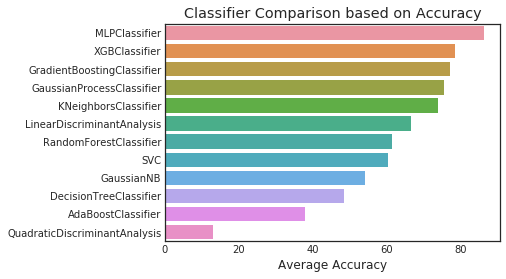

In [34]:
# Plot a barplot containing classifier name & accuracy score

sns.barplot(x='avg_acc', y=sorted_acc_df.index, data=sorted_acc_df)
plt.xlabel('Average Accuracy')
plt.title('Classifier Comparison based on Accuracy')

It seems like simple neural network `MLP` performs much `better` than others. Hence we can train a full blown `Fully Connected networks` in keras.

#### 4.2.1.5 Training a Keras Dense Model

In [9]:
# Dumping Xception train & valid set bottleneck features

x_train_botf = joblib.load(os.path.join(
    './save/pickles', 'x_train_botf.pickle'))
x_valid_botf = joblib.load(os.path.join(
    './save/pickles', 'x_valid_botf.pickle'))

y_train_botf = joblib.load(os.path.join(
    './save/pickles', 'y_train_botf.pickle'))
y_valid_botf = joblib.load(os.path.join(
    './save/pickles', 'y_valid_botf.pickle'))
print('Loading Xception train & valid set bottleneck features & labels done.')

Loading Xception train & valid set bottleneck features & labels done.


In [ ]:
% % time

BATCH_SIZE = 16
EPOCHS = 500
RANDOM_STATE = 21
# Fixing random seed
np.random.seed(RANDOM_STATE)

# Reduce LR On Plateau
lr_reduced = ReduceLROnPlateau(
    monitor='val_acc', factor=0.1, epsilon=1e-5, patience=5, verbose=1)

# Setting checkpoint & early stopping
checkpoint_path = './checkpoint/Xception_ADAM_best_weights.{epoch:02d}-{acc:.4f}.hdf5'
checkpoint = ModelCheckpoint(
    checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# TensorBoard logs
tensorboard = TensorBoard(log_dir='./logs{}'.format(time()),
                          histogram_freq=2000, write_graph=True, write_images=True)

# Early Stopping
# early_stop = EarlyStopping(monitor='val_acc', patience=5, mode='max')

# All callbacks
callbacks_list = [lr_reduced, checkpoint, tensorboard]


# Model Neural Network Architecture
inputs = Input(shape=(2048,))

# Adding 1st Fully connected, output layer & Dropout
fc = Dense(input_shape=(2048,), units=2048, activation='relu')(inputs)
fc = Dropout(0.5)(fc)

# Adding 2nd Fully connected, output layer & Dropout
fc = Dense(input_shape=(1024,), units=1024, activation='relu')(fc)
fc = Dropout(0.4)(fc)

# Adding 3rd Fully connected, output layer & Dropout
fc = Dense(input_shape=(512,), units=512, activation='relu')(fc)
fc = Dropout(0.3)(fc)

# Adding 4th Fully connected, output layer & Dropout
fc = Dense(input_shape=(256,), units=256, activation='relu')(fc)
fc = Dropout(0.2)(fc)

# Adding 5th Fully connected, output layer & Dropout
fc = Dense(input_shape=(128,), units=128, activation='relu')(fc)
fc = Dropout(0.1)(fc)

# Adding output layer
outputs = Dense(units=12, activation='softmax')(fc)

model = Model(inputs=inputs, outputs=outputs)

best_model = 'Xception_ADAM_best_weights.41-0.9428.hdf5'
# Load network weights
if os.path.exists(os.path.join('./checkpoint', best_model)):
    print('Loading weights from previous run...', best_model)
    model.load_weights(filepath=os.path.join('./checkpoint', best_model))
else:
    print('Weights not loaded.', best_model)


mypotim = Adam(lr=2 * 1e-3, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
# mypotim = SGD(lr=1 * 1e-1, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy',
              optimizer=mypotim,
              metrics=['accuracy'])
# Model Summary
model.summary()

# Convert categorical labels into one-hot vector
y_train_botf = to_categorical(np.array([CLASS[l] for l in y_train_botf]))

print('The Best Model will be saved in the following dir ', checkpoint_path)
print('Training of the model with Xception bottleneck features as inputs starts now ...')

# Fit the model
model.fit(x_train_botf, y_train_botf, validation_split=0.3, batch_size=BATCH_SIZE,
          epochs=EPOCHS, verbose=1, shuffle=True, callbacks=callbacks_list)

Loading weights from previous run... Xception_ADAM_best_weights.41-0.9428.hdf5
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 2048)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 2048)              4196352   
_________________________________________________________________
dropout_6 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dropout_7 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               524800    
_______________________________________________________________

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2660/2660 [==============================] - 2s 921us/step - loss: 0.5263 - acc: 0.8481 - val_loss: 0.5666 - val_acc: 0.8553

Epoch 00201: ReduceLROnPlateau reducing learning rate to 1.9996529085915142e-43.

Epoch 00201: val_acc did not improve from 0.85789
Epoch 202/500
2660/2660 [==============================] - 2s 911us/step - loss: 0.5118 - acc: 0.8556 - val_loss: 0.5666 - val_acc: 0.8553

Epoch 00202: val_acc did not improve from 0.85789
Epoch 203/500
2660/2660 [==============================] - 2s 910us/step - loss: 0.5742 - acc: 0.8523 - val_loss: 0.5666 - val_acc: 0.8553

Epoch 00203: val_acc did not improve from 0.85789
Epoch 204/500
2660/2660 [==============================] - 2s 909us/step - loss: 0.5323 - acc: 0.8485 - val_loss: 0.5666 - val_acc: 0.8553

Epoch 00204: val_acc did not improve from 0.85789
Epoch 205/500
2660/2660 [==============================] - 2s 910us/step - loss: 0.5631 - acc: 0.8402 - val_loss: 0.5666 - val_acc: 0.8553

Epoch 00205: val_acc did not imp

### 4.2.2 VGG Model

#### 4.2.2.1 Prepare & Load Data

The `VGG` model `input` dimesions are `224 * 224 * 3`. Hence we need to prepare images satisfying the dimensional requirements.

In [15]:
images_vgg = np.array([])

try:
    print('Loading VGG Images & Labels dict ...')
    images_vgg = joblib.load(os.path.join(
        './save/pickles', 'images-vgg.pickle'))
    labels_vgg = joblib.load(os.path.join(
        './save/pickles', 'labels-vgg.pickle'))
    print('Loading done.')
except Exception as e:
    print('Stacktrace', e)
    print('VGG Images & Labels dict does not exist.')

if (not images_vgg.size or not labels_vgg.size):
    img_size = (224, 224)
    print('Running load_seedlings method with img_size {} ...'.format(img_size))
    images_vgg, labels_vgg, images_per_class = load_seedlings_transfer(
        img_size=img_size)

    print('Dumping VGG Images & Labels dict ...')
    # Dumping dicts
    joblib.dump(images_vgg, os.path.join(
        './save/pickles', 'images-vgg.pickle'))
    joblib.dump(labels_vgg, os.path.join(
        './save/pickles', 'labels-vgg.pickle'))
    print('VGG Images & Labels dict dumping done.')

Loading VGG Images, Labels & images_per_class dict ...
Stacktrace [Errno 2] No such file or directory: './save/pickles/images-vgg.pickle'
VGG Images, Labels or images_per_class dict does not exist.
Running load_seedlings method with img_size (224, 224) ...
Dumping VGG Images, Labels & images_per_class dict ...
VGG Images, Labels or images_per_class dict dumping done.


In [16]:
# Type cast int to float for VGG16 model compatibility

images_vgg = images_vgg.astype(dtype='float32', copy=False)

print('Images Shape:', images_vgg.shape)
print('Image Data Type:', images_vgg[0].dtype)
print('Labels Shape:', labels_vgg.shape)
print('Label Data Type:', labels_vgg[0].dtype)

Images Shape: (4750, 224, 224, 3)
Image Data Type: float32
Labels Shape: (4750,)
Label Data Type: <U10


#### 4.2.2.2 Extract VGG Bottleneck Features

In [17]:
%time

input_dim = 224
POOLING = 'avg'
RANDOM_STATE = 21

# Numpy array to store extracted features from VGG model
images_vgg_features = np.zeros(
    (len(images_vgg), input_dim, input_dim, 3), dtype='float32')

# Extract features with Xception model
for i, image in tqdm(enumerate(images_vgg)):
    images_vgg_features[i] = vgg16.preprocess_input(
        np.expand_dims(image, axis=0))

print('Train Images shape: {} size: {:,}'.format(
    images_vgg_features.shape, images_vgg_features.size))

109it [00:00, 1087.22it/s]

CPU times: user 0 ns, sys: 10 µs, total: 10 µs
Wall time: 19.1 µs


4750it [00:02, 1954.69it/s]

Train Images shape: (4750, 224, 224, 3) size: 715,008,000


In [19]:
# Split the data in train & validation set
x_train, x_valid, y_train, y_valid = train_test_split(images_vgg_features,
                                                      labels_vgg,
                                                      shuffle=True,
                                                      train_size=0.8,
                                                      stratify=labels_vgg,
                                                      random_state=RANDOM_STATE
                                                      )

del images_vgg_features, labels_vgg

# VGG16 model, with weights pre-trained on ImageNet. This model can be built both with
# 'channels_first' data format (channels, height, width) or 'channels_last' data format (height, width, channels).
# The default input size for this model is 224x224.

vgg_bottleneck = vgg16.VGG16(
    weights='imagenet', include_top=False, pooling=POOLING)

# Calculating VGG train & valid set bottleneck features
x_train_botf_vgg = vgg_bottleneck.predict(x_train, batch_size=32, verbose=1)
x_valid_botf_vgg = vgg_bottleneck.predict(x_valid, batch_size=32, verbose=1)

del x_train, x_valid

print('VGG train bottleneck features shape: {} size: {:,}'.format(
    x_train_botf_vgg.shape, x_train_botf_vgg.size))
print('VGG valid bottleneck features shape: {} size: {:,}'.format(
    x_valid_botf_vgg.shape, x_valid_botf_vgg.size))

# Dumping VGG train & valid set bottleneck features
joblib.dump(x_train_botf_vgg, os.path.join(
    './save/pickles', 'x_train_botf_vgg.pickle'))
joblib.dump(x_valid_botf_vgg, os.path.join(
    './save/pickles', 'x_valid_botf_vgg.pickle'))

joblib.dump(y_train, os.path.join('./save/pickles', 'y_train_botf_vgg.pickle'))
joblib.dump(y_valid, os.path.join('./save/pickles', 'y_valid_botf_vgg.pickle'))
print('Dumping VGG train & valid set bottleneck features & labels done.')

950/950 [==============================] - 13s 14ms/step
VGG train bottleneck features shape: (3800, 512) size: 1,945,600
VGG valid bottleneck features shape: (950, 512) size: 486,400
Dumping VGG train & valid set bottleneck features & labels done.


#### 4.2.2.3 Training a Keras Dense Model

In [9]:
print('Loading VGG Images, Labels dict ...')
x_train_botf_vgg = joblib.load(os.path.join(
    './save/pickles', 'x_train_botf_vgg.pickle'))
x_valid_botf_vgg = joblib.load(os.path.join(
    './save/pickles', 'x_valid_botf_vgg.pickle'))

y_train = joblib.load(os.path.join(
    './save/pickles', 'y_train_botf_vgg.pickle'))
y_valid = joblib.load(os.path.join(
    './save/pickles', 'y_valid_botf_vgg.pickle'))
print('Loading VGG train & valid set bottleneck features & labels done.')

Loading VGG Images, Labels & images_per_class dict ...
Loading VGG train & valid set bottleneck features & labels done.


In [8]:
# Define Model Neural Network Architecture


def model_neural_network_vgg():

    # Model Neural Network Architecture
    inputs = Input(shape=(512,))

    # Adding 1st Fully connected, output layer & Dropout
    fc = Dense(input_shape=(512,), units=512, activation='relu')(inputs)
    fc = Dropout(0.3)(fc)

    # Adding 2nd Fully connected, output layer & Dropout
    fc = Dense(input_shape=(256,), units=256, activation='relu')(fc)
    fc = Dropout(0.2)(fc)

    # Adding 3rd Fully connected, output layer & Dropout
    fc = Dense(input_shape=(128,), units=128, activation='relu')(fc)
    fc = Dropout(0.1)(fc)

    # Adding output layer
    outputs = Dense(units=12, activation='softmax')(fc)

    model = Model(inputs=inputs, outputs=outputs)

    mypotim = Adam(lr=2 * 1e-3, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    #mypotim = SGD(lr=1 * 1e-1, momentum=0.9, nesterov=True)
    model.compile(loss='categorical_crossentropy',
                  optimizer=mypotim,
                  metrics=['accuracy'])
    # Model Summary
    # model.summary()

    return model

In [8]:
% % time

BATCH_SIZE = 16
EPOCHS = 500
RANDOM_STATE = 21
# Fixing random seed
np.random.seed(RANDOM_STATE)

# Reduce LR On Plateau
lr_reduced = ReduceLROnPlateau(
    monitor='val_acc', factor=0.1, epsilon=1e-5, patience=5, verbose=1)

# Setting checkpoint & early stopping
checkpoint_path = './checkpoint/VGG_ADAM_best_weights.{epoch:02d}-{acc:.4f}.hdf5'
checkpoint = ModelCheckpoint(
    checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

# TensorBoard logs
tensorboard = TensorBoard(
    log_dir='./logs', histogram_freq=2000, write_graph=True, write_images=True)

# Early Stopping
# early_stop = EarlyStopping(monitor='val_acc', patience=5, mode='max')

# All callbacks
callbacks_list = [lr_reduced, checkpoint, tensorboard]


# Model Neural Network Architecture
inputs = Input(shape=(512,))

# Adding 1st Fully connected, output layer & Dropout
fc = Dense(input_shape=(512,), units=512, activation='relu')(inputs)
fc = Dropout(0.3)(fc)

# Adding 2nd Fully connected, output layer & Dropout
fc = Dense(input_shape=(256,), units=256, activation='relu')(fc)
fc = Dropout(0.2)(fc)

# Adding 3rd Fully connected, output layer & Dropout
fc = Dense(input_shape=(128,), units=128, activation='relu')(fc)
fc = Dropout(0.1)(fc)

# Adding output layer
outputs = Dense(units=12, activation='softmax')(fc)

model = Model(inputs=inputs, outputs=outputs)


best_model = 'VGG_ADAM_best_weights.24-0.9872.hdf5'
# Load network weights
if os.path.exists(os.path.join('./checkpoint', best_model)):
    print('Loading weights from previous run...', best_model)
    model.load_weights(filepath=os.path.join('./checkpoint', best_model))
else:
    print('Weights not loaded.', best_model)


mypotim = Adam(lr=2 * 1e-3, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
#mypotim = SGD(lr=1 * 1e-1, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy',
              optimizer=mypotim,
              metrics=['accuracy'])
# Model Summary
model.summary()

# Convert categorical labels into one-hot vector
y_train = to_categorical(np.array([CLASS[l] for l in y_train]))

# Fit the model
model.fit(x_train_botf_vgg, y_train, validation_split=0.3, batch_size=BATCH_SIZE,
          epochs=EPOCHS, verbose=0, shuffle=True, callbacks=callbacks_list)

/home/indiano/miniconda3/envs/tf/lib/python3.5/site-packages/keras/callbacks.py:999: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Loading weights from previous run... VGG_ADAM_best_weights.24-0.9872.hdf5
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               32896     
_________________________________________________________________
dr

#### 4.2.2.4 Evaluate Model On Validation Set

Loading VGG Images & Labels for validation set ...
Loading VGG train & valid set bottleneck features & labels done.

Calculating Train Set accuracy ...
3800/3800 [==============================] - 0s 80us/step
Train Set accuracy: [18.84, 95.95]%

Calculating Valid Set accuracy ...
950/950 [==============================] - 0s 76us/step
Valid Set accuracy: [58.72, 86.21]%

Calculating Confusion Matrix & Classification Report ...
950/950 [==============================] - 0s 209us/step


Confusion matrix of the Seedlings Valid set




,Sugar beet,Scentless Mayweed,Fat Hen,Charlock,Shepherds Purse,Loose Silky-bent,Maize,Cleavers,Black-grass,Small-flowered Cranesbill,Common wheat,Common Chickweed
Sugar beet,24,0,0,0,3,0,25,0,1,0,0,0
Scentless Mayweed,0,77,0,0,0,1,0,0,0,0,0,0
Fat Hen,0,0,53,1,0,1,0,0,0,3,0,0
Charlock,0,1,0,109,1,1,0,0,2,2,6,0
Shepherds Purse,2,0,0,0,36,1,3,0,2,0,0,0
Loose Silky-bent,1,0,1,4,2,80,0,0,2,0,0,5
Maize,10,0,0,0,0,1,117,0,3,0,0,0
Cleavers,0,0,0,0,0,0,0,43,0,0,0,1
Black-grass,0,0,0,2,0,1,4,0,94,2,0,0
Small-flowered Cranesbill,0,1,0,3,0,0,0,0,8,32,2,0




Saving Confusion Matrices in the ./save/con_matrix directory


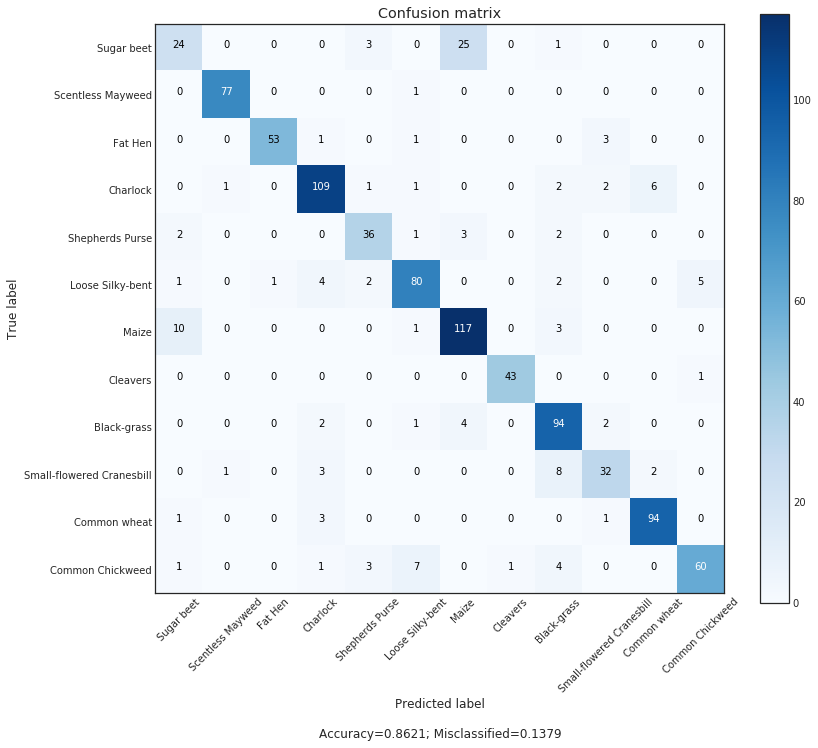



Classification Report
                           precision    recall  f1-score   support

               Sugar beet       0.62      0.45      0.52        53
        Scentless Mayweed       0.97      0.99      0.98        78
                  Fat Hen       0.98      0.91      0.95        58
                 Charlock       0.89      0.89      0.89       122
          Shepherds Purse       0.80      0.82      0.81        44
         Loose Silky-bent       0.86      0.84      0.85        95
                    Maize       0.79      0.89      0.84       131
                 Cleavers       0.98      0.98      0.98        44
              Black-grass       0.81      0.91      0.86       103
Small-flowered Cranesbill       0.80      0.70      0.74        46
             Common wheat       0.92      0.95      0.94        99
         Common Chickweed       0.91      0.78      0.84        77

              avg / total       0.86      0.86      0.86       950



True vs Prediction of the Seedlin

Image,Prediction,True
"[0.0, 0.0, 0.34213066, 0.0, 0.9592821, 0.0, 0....",4,11
"[0.0, 0.0, 1.5533024, 0.0, 0.0016281978, 0.0, ...",6,0
"[0.0, 0.0, 6.6867023, 0.14889081, 0.0, 0.0, 1....",9,3
"[0.0, 0.09866158, 1.4236887, 0.053569775, 0.10...",5,3
"[1.1206459, 0.0, 3.8674812, 0.19608311, 0.0608...",3,10


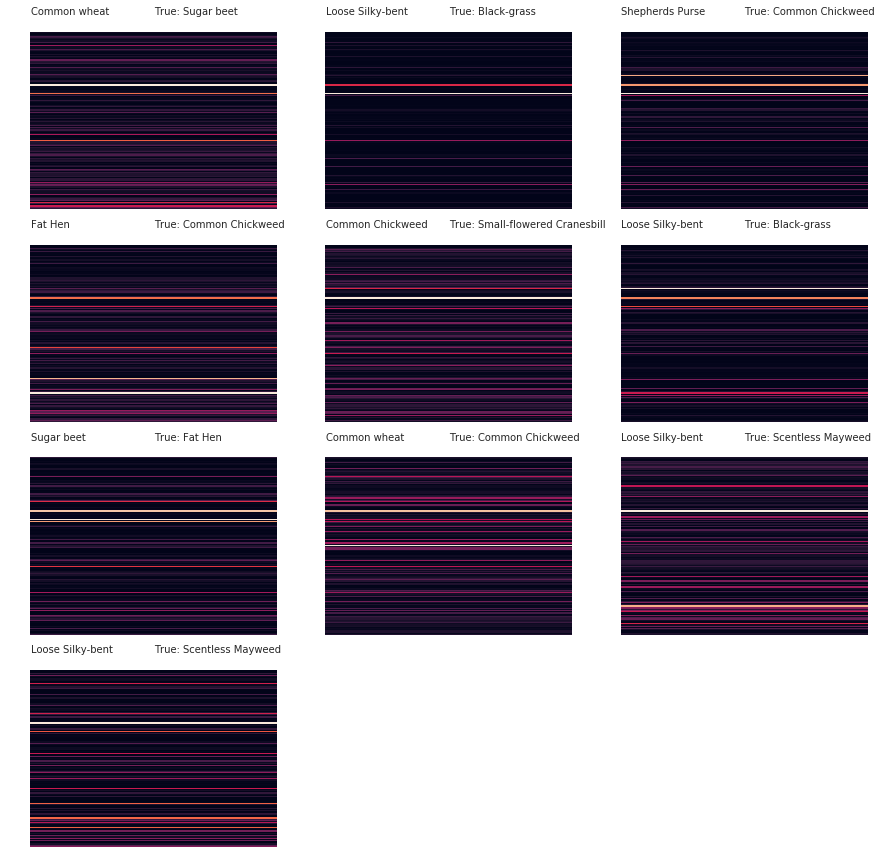



The best validation accuracy: 86.21% 
Model name: VGG_ADAM_best_weights.46-0.8728.hdf5


In [67]:
# Define Test method


def test_valid(X_train, x_valid, y_train, y_valid, best_model, stats=False):

    # Initialize the model neural networks architecture & load weights
    model = model_neural_network_vgg()
    model.load_weights(filepath=os.path.join('./checkpoint', best_model))

    # Evaluate on train and valid set
    print('\nCalculating Train Set accuracy ...')
    train_acc = model.evaluate(X_train, to_categorical(
        np.array([CLASS[l] for l in y_train])))
    print('Train Set accuracy: {}%'.format(
        [np.round(acc*100, 2) for acc in train_acc]))

    print('\nCalculating Valid Set accuracy ...')
    valid_acc = model.evaluate(x_valid, to_categorical(
        np.array([CLASS[l] for l in y_valid])))
    print('Valid Set accuracy: {}%'.format(
        [np.round(acc*100, 2) for acc in valid_acc]))

    if stats:
        print('\nCalculating Confusion Matrix & Classification Report ...')
        # Predictions on the valid set
        prob = model.predict(x_valid, verbose=1)
        predictions = prob.argmax(axis=1)

        # True class label
        true = np.array([CLASS[l] for l in y_valid])

        # Confusion matrix on the valid set.
        con_matrix = confusion_matrix(true, predictions)

        print('\n\nConfusion matrix of the Seedlings Valid set\n\n')
        display(pd.DataFrame(con_matrix, columns=list(
            CLASS.keys()), index=list(CLASS.keys())))

        # Plot the confusion matrix
        plot_confusion_matrix(con_matrix,
                              target_names=list(CLASS.keys()),
                              plt_name='Seedlings_Con_Matrix_VGG',
                              rootdir='./',
                              save_dir='save/con_matrix',
                              title='Confusion matrix',
                              cmap=plt.cm.Blues,
                              normalize=False)

        print('\n\nClassification Report')
        print(classification_report(true, predictions,
                                    target_names=list(CLASS.keys())))

        print('\n\nTrue vs Prediction of the Seedlings Valid set\n\n')
        predictions_df = pd.DataFrame(
            {'Image': [x for x in x_valid], 'True': true, 'Prediction': predictions})

        plot_missclassified = True
        if plot_missclassified:
            missclassified = predictions_df[predictions_df['True']
                                            != predictions_df['Prediction']]
            print('Top 10 missclassified results.')
            display(HTML(missclassified.head().to_html(index=False)))
            print('\n')
            grid_plot_for_class(missclassified.head(10))

    return valid_acc[-1]


# Testing the model on validation set

def valid_main():

    try:
        print('Loading VGG Images & Labels for validation set ...')
        x_train_botf_vgg = joblib.load(os.path.join(
            './save/pickles', 'x_train_botf_vgg.pickle'))
        x_valid_botf_vgg = joblib.load(os.path.join(
            './save/pickles', 'x_valid_botf_vgg.pickle'))
        y_train = joblib.load(os.path.join(
            './save/pickles', 'y_train_botf_vgg.pickle'))
        y_valid = joblib.load(os.path.join(
            './save/pickles', 'y_valid_botf_vgg.pickle'))
        print('Loading VGG train & valid set bottleneck features & labels done.')
    except Exception as e:
        print('Stacktrace', e)
        print('VGG Images & Labels for validation set does not exist.')

    # Best of 3 iterations
    # The best validation accuracy: 0.8621052634088616
    # Model name: ./checkpoint/VGG_ADAM_best_weights.46-0.8728.hdf5

    # The best validation accuracy: 0.8621052634088616
    # Model name: ./checkpoint/VGG_ADAM_best_weights.46-0.8728.hdf5

    # The best validation accuracy: 0.8621052634088616
    # Model name: ./checkpoint/VGG_ADAM_best_weights.46-0.8728.hdf5

    # best_model = input('Enter the name of best model saved in ./logs dir: ')
    best_model = 'VGG_ADAM_best_weights.46-0.8728.hdf5'

    run_all_saved_model = False
    # Run all the saved models & find one with best validation accuracy
    if run_all_saved_model:
        best_valid_acc = 0.0
        for saved_model in glob(os.path.join('./checkpoint', "*.hdf5")):
            if os.path.basename(saved_model).startswith('VGG_ADAM_best_weights'):
                print('*'*100)
                valid_acc = test_valid(
                    x_train_botf_vgg, x_valid_botf_vgg, y_train, y_valid, os.path.basename(saved_model))

                if (valid_acc > best_valid_acc):
                    best_valid_acc = valid_acc
                    best_model = saved_model
                    print('New best validation accuracy: {} \n Model name: {}'.format(
                        best_valid_acc, best_model))

        print('\n\nThe best validation accuracy: {} \n Model name: {}'.format(
            best_valid_acc, best_model))

    valid_acc = test_valid(x_train_botf_vgg, x_valid_botf_vgg,
                           y_train, y_valid, os.path.basename(best_model), stats=True)
    print('\n\nThe best validation accuracy: {}% \nModel name: {}'.format(
        np.round(valid_acc*100, 2), best_model))


if __name__ == '__main__':
    valid_main()

#### Submission on Test Set using VGG Bottleneck Features extraction

In [9]:
input_dim = 224
POOLING = 'avg'
RANDOM_STATE = 21

# Define Test method


def test(img, label, best_model):

    # Initialize the model neural networks architecture & load weights
    model = model_neural_network_vgg()
    model.load_weights(filepath=os.path.join('./checkpoint', best_model))

    # Predictions
    prob = model.predict(img, verbose=1)
    pred = prob.argmax(axis=-1)

    submission_df = pd.DataFrame({"file": label,
                                  "species": [INV_CLASS[p] for p in pred]})
    submission_df.to_csv(os.path.join(
        './save', 'submission_vgg.csv'), index=False, header=True)


# Testing the model

def test_main():

    # Load Seedlings Test set
    images_test_vgg = np.array([])

    try:
        print('Loading Seedlings Test set ...')
        images_test_vgg = joblib.load(os.path.join(
            './save/pickles', 'images-test-vgg.pickle'))
        ids_test_vgg = joblib.load(os.path.join(
            './save/pickles', 'ids-test-vgg.pickle'))
        print('Loading Seedlings Test set done.')
    except Exception as e:
        print('Stacktrace', e)
        print('Seedlings Test set VGG Images does not exist.')

    if (not images_test_vgg.size or not ids_test_vgg.size):
        img_size = (224, 224)
        print('Running load_seedlings method with img_size {} ...'.format(img_size))
        images_test_vgg, ids_test_vgg = load_seedlings_transfer_test(
            img_size=img_size)

        print('Dumping Seedlings Test set ...')
        # Dumping files
        joblib.dump(images_test_vgg, os.path.join(
            './save/pickles', 'images-test-vgg.pickle'))
        joblib.dump(ids_test_vgg, os.path.join(
            './save/pickles', 'ids-test-vgg.pickle'))
        print('Seedlings Test set dumping done.')

    # Type cast int to float for VGG16 model compatibility
    images_test_vgg = images_test_vgg.astype(dtype='float32', copy=False)

    print('Images Shape:', images_test_vgg.shape)
    print('Image Data Type:', images_test_vgg.dtype)
    print('Labels Shape:', ids_test_vgg.shape)
    print('Label Data Type:', ids_test_vgg.dtype)

    # VGG Preprocssing input
    # Numpy array to store extracted features from VGG model
    images_test_vgg_features = np.zeros(
        (len(images_test_vgg), input_dim, input_dim, 3), dtype='float32')

    # Extract features with VGG model
    for i, image in tqdm(enumerate(images_test_vgg)):
        images_test_vgg_features[i] = vgg16.preprocess_input(
            np.expand_dims(image, axis=0))

    print('Train Images shape: {} size: {:,}'.format(
        images_test_vgg_features.shape, images_test_vgg_features.size))

    del images_test_vgg

    # VGG Bottleneck Features extraction
    vgg_bottleneck = vgg16.VGG16(
        weights='imagenet', include_top=False, pooling=POOLING)

    # Calculating VGG train & valid set bottleneck features
    x_test_botf_vgg = vgg_bottleneck.predict(
        images_test_vgg_features, batch_size=32, verbose=1)
    joblib.dump(x_test_botf_vgg, os.path.join(
        './save/pickles', 'x_test_botf_vgg.pickle'))

    best_model = 'VGG_ADAM_best_weights.46-0.8728.hdf5'
    test(x_test_botf_vgg, ids_test_vgg, best_model)


if __name__ == '__main__':
    test_main()

Loading Seedlings Test set ...
Loading Seedlings Test set done.


152it [00:00, 1515.21it/s]

Images Shape: (794, 224, 224, 3)
Image Data Type: float32
Labels Shape: (794,)
Label Data Type: <U13


794it [00:00, 1668.95it/s]


Train Images shape: (794, 224, 224, 3) size: 119,519,232
794/794 [==============================] - 0s 67us/step


## 4.3 XGB

### Prepare & Load Data

In [164]:
display(features_df.head())

,area,height,label,largest_contour_area,no_of_countours,width
0,24198.5,360,Cleavers,12418.0,3,360
1,8176.0,149,Cleavers,8176.0,1,149
2,12717.0,225,Cleavers,12717.0,1,225
3,35139.0,404,Cleavers,21444.0,5,404
4,20688.0,315,Cleavers,9436.0,12,315


In [167]:
# Select the numeric features, drop NA values

x_train_features =` features_df.loc[:, [
    'height', 'width', 'largest_contour_area', 'label']]
x_train_features['area_per_contour'] = features_df.loc[:,
                                                       'area'] / features_df.loc[:, 'no_of_countours']

print('Displaying Null rows/columns ...')
display(x_train_features[x_train_features.isnull().any(axis=1)])

x_train_features.dropna(inplace=True)
x_train_features.reset_index(drop=True, inplace=True)

# Pop out labels

labels = x_train_features.pop('label')

# Scale using MinMaxScaler

x_train_features_scaled = MinMaxScaler().fit_transform(x_train_features)
x_train_features.loc[:] = x_train_features_scaled

print('\nTop 10 rows')
x_train_features.head()

Displaying Null rows/columns ...


,height,width,largest_contour_area,label,area_per_contour
1769,131,131,0.0,Loose Silky-bent,NaN
2381,114,114,0.0,Common wheat,NaN
3951,91,91,0.0,Black-grass,NaN
4592,63,63,0.0,Common Chickweed,NaN



Top 10 rows


,height,width,largest_contour_area,area_per_contour
0,0.091256,0.078894,0.005999,0.016947
1,0.029343,0.025368,0.003949,0.017178
2,0.051643,0.044647,0.006143,0.026718
3,0.104167,0.090056,0.010360,0.014765
4,0.078052,0.067478,0.004558,0.003622


### Encode labels using LabelEncoder

In [168]:
# Encode labels and create classes

le = LabelEncoder()
le.fit(labels)
labels_encoded = le.transform(labels)
print("\n\nClasses: ", le.classes_)

# Convert labels into categorical values
labels_onehot = to_categorical(labels_encoded)
print("\nNumber of One Hot encoded class labels: ", labels_onehot.shape[1])



Classes:  ['Black-grass' 'Charlock' 'Cleavers' 'Common Chickweed' 'Common wheat'
 'Fat Hen' 'Loose Silky-bent' 'Maize' 'Scentless Mayweed'
 'Shepherds Purse' 'Small-flowered Cranesbill' 'Sugar beet']

Number of One Hot encoded class labels:  12


### Classifier Comparison

In [169]:
% % time

x_train_features = np.array(x_train_features)
labels_encoded = np.array(labels_encoded)


def classifier_comparison(n_splits=3):
    # Classifier names & initializations
    names = ["Nearest Neighbors", "SVM", "Gaussian Process",
             "Decision Tree", "Random Forest", "Neural Net", "AdaBoost", "GradientBoost"
             "Naive Bayes", "LDA", "QDA", "XGB Classifier"]

    classifiers = [
        KNeighborsClassifier(3),
        SVC(probability=True),
        GaussianProcessClassifier(),
        DecisionTreeClassifier(),
        RandomForestClassifier(),
        MLPClassifier(),
        AdaBoostClassifier(),
        GradientBoostingClassifier(),
        GaussianNB(),
        LinearDiscriminantAnalysis(),
        QuadraticDiscriminantAnalysis(),
        XGBClassifier()]

    # Split & shuffle data using Stratified K Fold
    kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=21)

    # Calculate accuracy over all splits, classifiers
    count = 0
    acc_dict = defaultdict(list)
    for train_index, test_index in kfold.split(x_train_features, labels_encoded):
        xtrain, ytrain = x_train_features[train_index], labels_encoded[train_index]
        xtest, ytest = x_train_features[test_index], labels_encoded[test_index]
        print('Iteration: ', count)

        # iterate over classifiers
        for clf in classifiers:
            clf_name = clf.__class__.__name__
            clf.fit(xtrain, ytrain)
            predictions = clf.predict(xtest)
            accuracy = accuracy_score(ytest, predictions)

            # Append results in default dict of lists
            acc_dict[clf_name].append(accuracy)

        count += 1

    return acc_dict


# Call the classifier_comparison module & save the results
acc_dict = classifier_comparison(n_splits=3)

Iteration:  0
Iteration:  1
Iteration:  2
CPU times: user 8min 42s, sys: 5min 57s, total: 14min 40s
Wall time: 4min 56s


In [170]:
# Dataframe containing classifier name & accuracy score
acc_df = pd.DataFrame.from_dict(acc_dict, orient='index')
acc_df = acc_df.rename(
    columns={0: '1st Iteration', 1: '2nd Iteration', 2: '3rd Iteration'})

# Calculate average accuracy
acc_df['avg_acc'] = acc_df.mean(axis=1)
acc_df = (acc_df*100).round(2)

sorted_acc_df = acc_df.sort_values(by='avg_acc', ascending=False)
display(sorted_acc_df)

,1st Iteration,2nd Iteration,3rd Iteration,avg_acc
XGBClassifier,47.64,48.45,47.78,47.96
GradientBoostingClassifier,47.76,48.64,47.21,47.87
RandomForestClassifier,44.93,44.97,45.18,45.03
KNeighborsClassifier,40.33,42.00,39.23,40.52
DecisionTreeClassifier,40.64,40.10,39.42,40.05
MLPClassifier,37.49,35.67,36.69,36.62
AdaBoostClassifier,17.64,23.66,26.68,22.66
LinearDiscriminantAnalysis,22.56,23.85,21.23,22.54
GaussianNB,20.48,23.28,21.55,21.77
GaussianProcessClassifier,20.86,20.94,19.07,20.29


Text(0.5,1,'Classifier Comparison based on Accuracy')

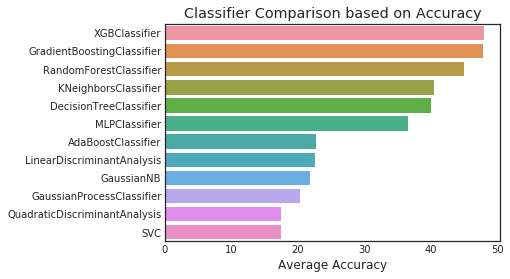

In [171]:
# Plot a barplot containing classifier name & accuracy score

sns.barplot(x='avg_acc', y=sorted_acc_df.index, data=sorted_acc_df)
plt.xlabel('Average Accuracy')
plt.title('Classifier Comparison based on Accuracy')

It seems like simple `XGB` performs much `better` than others but accuracy is very less in comparison to a full blown `CNN networks`.

# 5. Deployment

Deployment in this context means publishing the resulting prediction from the model to the Kaggle leaderboard. To do this do the following:

 1. select the cell below and run it by pressing the play button.
 2. Press the `Publish` button in top right corner.
 3. Select `Output` on the notebook menubar
 4. Select the result dataset and press `Submit to Competition` button

# 6. Further Improvements

It's now time for you to get your hands even dirtier and go at it all by yourself in a `challenge`! 

1. Try to use the creative data preprocessing steps, promising models, ensemble of them, different algorithms and compare their result
    * Experiment with stacking different input features in different ways (combinations) to understand their impact on the accuracy
    * Do this by optimizing hyperparameters
2. Try adding new features


**The winner is the one to get the highest scoring model for the validation set.**